# Micro Credit Defaulter

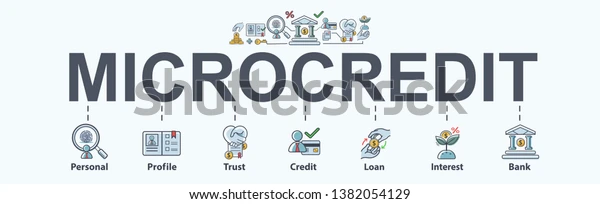

### Problem Statement:

A Microfinance Institution (MFI) is an organization that offers financial services to low income populations. MFS becomes very useful when targeting especially the unbanked poor families living in remote areas with not much sources of income. The Microfinance services (MFS) provided by MFI are Group Loans, Agricultural Loans, Individual Business Loans and so on. 
Many microfinance institutions (MFI), experts and donors are supporting the idea of using mobile financial services (MFS) which they feel are more convenient and efficient, and cost saving, than the traditional high-touch model used since long for the purpose of delivering microfinance services. Though, the MFI industry is primarily focusing on low income families and are very useful in such areas, the implementation of MFS has been uneven with both significant challenges and successes.
Today, microfinance is widely accepted as a poverty-reduction tool, representing $70 billion in outstanding loans and a global outreach of 200 million clients.

We are working with one such client that is in Telecom Industry. They are a fixed wireless telecommunications network provider. They have launched various products and have developed its business and organization based on the budget operator model, offering better products at Lower Prices to all value conscious customers through a strategy of disruptive innovation that focuses on the subscriber. 

They understand the importance of communication and how it affects a person’s life, thus, focusing on providing their services and products to low income families and poor customers that can help them in the need of hour. 
They are collaborating with an MFI to provide micro-credit on mobile balances to be paid back in 5 days. The Consumer is believed to be defaulter if he deviates from the path of paying back the loaned amount within the time duration of 5 days. For the loan amount of 5 (in Indonesian Rupiah), payback amount should be 6 (in Indonesian Rupiah), while, for the loan amount of 10 (in Indonesian Rupiah), the payback amount should be 12 (in Indonesian Rupiah). 
The sample data is provided to us from our client database. It is hereby given to you for this exercise. In order to improve the selection of customers for the credit, the client wants some predictions that could help them in further investment and improvement in selection of customers.

### Exercise:
Build a model which can be used to predict in terms of a probability for each loan transaction, whether the customer will be paying back the loaned amount within 5 days of insurance of loan. In this case, Label ‘1’ indicates that the loan has been payed i.e. Non- defaulter, while, Label ‘0’ indicates that the loan has not been payed i.e. defaulter.  

### Points to Remember:
- There are no null values in the dataset. 
- There may be some customers with no loan history. 
- The dataset is imbalanced. Label ‘1’ has approximately 87.5% records, while, label ‘0’ has approximately 12.5% records.
- For some features, there may be values which might not be realistic. You may have to observe them and treat them with a suitable explanation.
- You might come across outliers in some features which you need to handle as per your understanding. Keep in mind that data is expensive and we cannot lose more than 7-8% of the data.

### Importing necessary libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import scipy as stats
import os

import warnings
warnings.filterwarnings("ignore")

### Importing Dataset

In [2]:
df = pd.read_csv("Micro_Credit_loan.csv")
df

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,...,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,...,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,...,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,...,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,209589,1,22758I85348,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,...,6.0,0.0,2.0,12,6,0.0,1.000000,1.000000,UPW,2016-06-17
209589,209590,1,95583I84455,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,0.0,...,6.0,0.0,3.0,18,6,0.0,1.000000,1.000000,UPW,2016-06-12
209590,209591,1,28556I85350,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,0.0,...,12.0,0.0,6.0,54,12,0.0,4.000000,3.833333,UPW,2016-07-29
209591,209592,1,59712I82733,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,38.0,...,12.0,0.0,3.0,24,12,0.0,0.000000,10.500000,UPW,2016-07-25


Here we can notice first 5  and last 5 rows of the dataset. The above dataset shows that there are 209593 rows and 37 columns present. The dataset contains both dependent and independent variables. In this dataset **"label"** is the target variableand the remaining feature columns that determine or help in predicting the default loan. Since the target variable is consists of 2 classes which is categorical in nature which makes this to be a **"Classification Problem"**. Also the dataset contains both categorical and numerical types of data.

### Data Description (Attribute Information)

|Serial No||Variable||Definition||Comment|
|--------------------||--------------------||--------------------||--------------------|
|1||label||Flag indicating whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}|||
|2||msisdn||mobile number of user|||
|3||aon||age on cellular network in days|||
|4||daily_decr30||Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)|||
|5||daily_decr90||Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)|||
|6||rental30||Average main account balance over last 30 days||Unsure of given definition|
|7||rental90||Average main account balance over last 90 days||Unsure of given definition|
|8||last_rech_date_ma||Number of days till last recharge of main account|||
|9||last_rech_date_da||Number of days till last recharge of data account|||
|10||last_rech_amt_ma||Amount of last recharge of main account (in Indonesian Rupiah)|||
|11||cnt_ma_rech30||Number of times main account got recharged in last 30 days|||
|12||fr_ma_rech30||Frequency of main account recharged in last 30 days||Unsure of given definition|
|13||sumamnt_ma_rech30||Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)|||
|14||medianamnt_ma_rech30||Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)|||
|15||medianmarechprebal30||Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)|||
|16||cnt_ma_rech90||Number of times main account got recharged in last 90 days|||
|17||fr_ma_rech90||Frequency of main account recharged in last 90 days||Unsure of given definition|
|18||sumamnt_ma_rech90||Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)|||
|19||medianamnt_ma_rech90||Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)|||
|20||medianmarechprebal90||Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)|||
|21||cnt_da_rech30||Number of times data account got recharged in last 30 days|||
|22||fr_da_rech30||Frequency of data account recharged in last 30 days|||
|23||cnt_da_rech90||Number of times data account got recharged in last 90 days|||
|24||fr_da_rech90||Frequency of data account recharged in last 90 days|||
|25||cnt_loans30||Number of loans taken by user in last 30 days|||
|26||amnt_loans30||Total amount of loans taken by user in last 30 days|||
|27||maxamnt_loans30||maximum amount of loan taken by the user in last 30 days||There are only two options: 5 & 10 Rs., for which the user needs to pay back 6 & 12 Rs. respectively|
|28||medianamnt_loans30||Median of amounts of loan taken by the user in last 30 days|||
|29||cnt_loans90||Number of loans taken by user in last 90 days|||
|30||amnt_loans90||Total amount of loans taken by user in last 90 days|||
|31||maxamnt_loans90||maximum amount of loan taken by the user in last 90 days|||
|32||medianamnt_loans90||Median of amounts of loan taken by the user in last 90 days|||
|33||payback30||Average payback time in days over last 30 days|||
|34||payback90||Average payback time in days over last 90 days|||
|35||pcircle||telecom circle|||
|36||pdate||date|||

## Exploratory Data Analysis (EDA)

In [3]:
# To display maximum columns in the dataset
pd.set_option("display.max_columns",None)

In [4]:
df.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


In [5]:
# Checking the dimensions of the dataset
print("There are {} Rows and {} Columns in our dataframe".format(df.shape[0], df.shape[1]))

There are 209593 Rows and 37 Columns in our dataframe


In [6]:
# Checking the column names in the dataset
print("Columns present in our dataset:\n",df.columns)

Columns present in our dataset:
 Index(['Unnamed: 0', 'label', 'msisdn', 'aon', 'daily_decr30', 'daily_decr90',
       'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30',
       'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30',
       'payback90', 'pcircle', 'pdate'],
      dtype='object')


These are the columns present in our dataset.

In [7]:
# To get good overview of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

- This info() method gives the information about the dataset which includes indexing type, column type, no-null values and memory usage.
- The dataset contains 3 different types of data, integer, object and float. There are 3 columns with object datatype. We will encode the object datatypes using appropriate encoding techniques before building machine learning models.

In [8]:
# Checking for null values
df.isnull().sum()

Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

Using "isnull" method we can able to observe sum of missing values present in the dataset. It looks like there are no null values present. So no need to worry much.

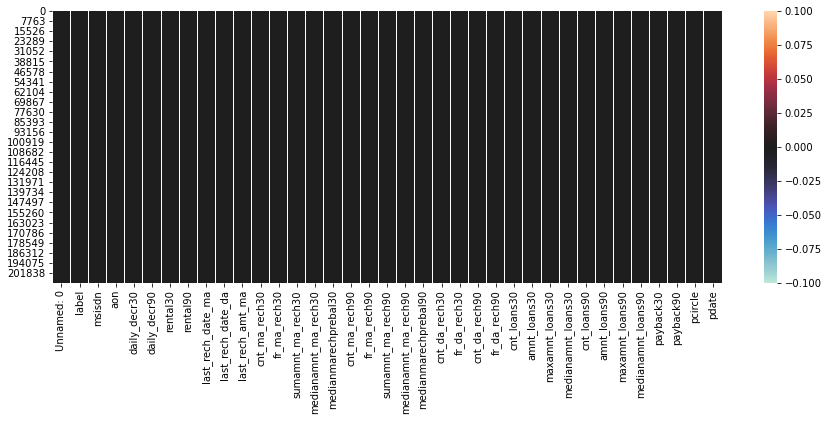

In [9]:
# Let's visualize the null values clearly using heat map
plt.figure(figsize=(15,5))
sns.heatmap(df.isnull(), cmap="icefire")
plt.show()

It is clear from the heat map that there are no null values in any of the column.

In [10]:
#lets check for duplicate values if there are any
df.duplicated().sum()

0

It is good to see that there are no duplicate etries present in the dataset.

In [11]:
# Checking number of unique values in each column of dataset
df.nunique().to_frame("No of Unique Values")

,No of Unique Values
Unnamed: 0,209593
label,2
msisdn,186243
aon,4507
daily_decr30,147025
daily_decr90,158669
rental30,132148
rental90,141033
last_rech_date_ma,1186
last_rech_date_da,1174


Above are the number of unique values present in the columns of the dataset.

## Feature Engineering
## Feature Selection
- From the nunique() method the column "Unnamed: 0" contains only index values also the column "msisdn" contains mobile number of the user. These columns are not contributing much for prediction also it has no relation with the target hence I am dropping them.
- Also, we can notice the column "pcircle" has only one unique value, so we can drop this column.

In [12]:
# Checking value count of pcircle
print("Value count of pcircle:",df["pcircle"].value_counts())
# Checking unique value present in pcircle
print("\nNumber of unique value in pcircle:",df["pcircle"].nunique())

Value count of pcircle: UPW    209593
Name: pcircle, dtype: int64

Number of unique value in pcircle: 1


In [13]:
# Dropping pcircle column as it has unique value throughut the data
df.drop("pcircle",axis=1,inplace=True)

In [14]:
# Dropping irrelevant columns
df.drop(columns = ['Unnamed: 0', 'msisdn'] , inplace = True )

## Dealing with zero values

In [15]:
Zero_value = pd.DataFrame(df.isin([0]).sum().sort_values(ascending=False))
Zero_value.columns=['Count of Zero values']
Zero_value['% of Zero values']=Zero_value['Count of Zero values']/2095.93    # 209593/100 = 2095.93
Zero_value

,Count of Zero values,% of Zero values
fr_da_rech90,208728,99.587295
fr_da_rech30,208014,99.246635
cnt_da_rech30,205479,98.037148
cnt_da_rech90,204226,97.439323
last_rech_date_da,202861,96.788061
medianamnt_loans90,197424,94.193985
medianamnt_loans30,195445,93.249775
payback30,106712,50.913914
payback90,95699,45.659445
fr_ma_rech30,78683,37.540853


By looking into the above method of finding zero values we can observe the features

- fr_da_rech90
- fr_da_rech30
- cnt_da_rech30
- cnt_da_rech90
- last_rech_date_da
- medianamnt_loans90
- medianamnt_loans30 

having zero values more than 90% which are not required for the predictions so dropping these columns.

In [16]:
# Dropping columns having more than 90% of zero values
df.drop(columns=["fr_da_rech90","fr_da_rech30","cnt_da_rech30","cnt_da_rech90","last_rech_date_da","medianamnt_loans90","medianamnt_loans30"],axis=1,inplace=True)

## Feature Extraction
The column "pdate" has object data type which is in the form of dd/mm/yy so we need to convert it into datetime type. And we will extract day, month and year from the column "pdate".

In [17]:
# convert pdate column from object type into datetime type
df.pdate = pd.to_datetime(df.pdate)

In [18]:
# Extracting Day, Month and Year from pdate column

# Extract day feature from pdate feature
df["Day"] = df["pdate"].dt.day

# Extract month from pdate
df["Month"] = df["pdate"].dt.month

# Extract Year from pdate
df["Year"] = df["pdate"].dt.year

In [19]:
df[['Day','Month','Year']]

,Day,Month,Year
0,20,7,2016
1,10,8,2016
2,19,8,2016
3,6,6,2016
4,22,6,2016
...,...,...,...
209588,17,6,2016
209589,12,6,2016
209590,29,7,2016
209591,25,7,2016


As we have extracted required information from pdate column, let's drop this column as it is of no use.

In [20]:
# Dropping pdate column after separating day, month and year from it
df.drop("pdate",axis=1,inplace=True)

We have successfully extracted day, month and year from pdate column and dropped pdate feature after extraction.

In [21]:
# checkig the unique value present in column 'Year'
print("No of unique values present in Year column:",df['Year'].nunique())
# Checking value counts of Year column
print("\nValue count of Year column:",df["Year"].value_counts())

No of unique values present in Year column: 1

Value count of Year column: 2016    209593
Name: Year, dtype: int64


- As we can see there is only one unique value that means all user data present in the dataset is collected in the same year 2016. We can also observe the value counts of the column Year.
- We can drop this column 'Year' since it won't affect our predictions.

In [22]:
# Dropping Year column 
df.drop("Year",axis=1,inplace=True)

In [23]:
# Checking dataframe after feature engineering
df

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Day,Month
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,2,12,6.0,2.0,12,6,29.000000,29.000000,20,7
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,1,12,12.0,1.0,12,12,0.000000,0.000000,10,8
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,1,6,6.0,1.0,6,6,0.000000,0.000000,19,8
3,1,241.0,21.228000,21.228000,159.42,159.42,41.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,2,12,6.0,2.0,12,6,0.000000,0.000000,6,6
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,7,42,6.0,7.0,42,6,2.333333,2.333333,22,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,1,404.0,151.872333,151.872333,1089.19,1089.19,1.0,4048,3,2.0,10404.0,3178.0,91.81,3,2,10404,3178.0,91.81,2,12,6.0,2.0,12,6,1.000000,1.000000,17,6
209589,1,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,773,4,1.0,3092.0,773.0,161.30,6,2,4038,773.0,111.80,3,18,6.0,3.0,18,6,1.000000,1.000000,12,6
209590,1,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,1539,5,8.0,9334.0,1539.0,51.13,11,5,18592,1539.0,47.13,4,42,12.0,6.0,54,12,4.000000,3.833333,29,7
209591,1,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,773,5,4.0,12154.0,773.0,164.00,6,4,17941,2410.5,100.00,2,18,12.0,3.0,24,12,0.000000,10.500000,25,7


In [24]:
# Checking the uniqueness of target column
print("The unique value present in label is:",df['label'].unique())

The unique value present in label is: [0 1]


There are only two unique values present in the label.

In [25]:
# Checking value count of the label
print("The value count of the label is:\n",df["label"].value_counts())

The value count of the label is:
 1    183431
0     26162
Name: label, dtype: int64


This gives the list of values in the label. As we can see Label ‘1’ indicates that the loan has been payed i.e. Non- defaulter which has 183431 values, while, Label ‘0’ indicates that the loan has not been payed i.e. defaulter which has 26162 values. So from this we can notice there is a class imbalance issue exists which need to be balanced in the later part.

In [26]:
# checkig the value count in column 'maxamnt_loans30' = maximum amount of loan taken by the user in last 30 days
df['maxamnt_loans30'].value_counts()

6.000000        179193
12.000000        26109
0.000000          3244
94122.633158         1
59668.008360         1
                 ...  
66749.081149         1
55723.858041         1
31545.936341         1
66847.875001         1
96775.751803         1
Name: maxamnt_loans30, Length: 1050, dtype: int64

We know that the maximum amount taken by the user in last 30 days.

- There are only two options: 5 & 10 Rs., for which the user needs to pay back 6 & 12 Rs. respectively. Also we can see zero entries which means the user haven't taken any kind of loan.
- But from the value counts we can observe the data other than 6,12 and 0. So the data other than these values need to be converted into 0 assuming the user haven't taken any kind of loan, because there is no other amount to be return other than 6 & 12.

In [27]:
# Checking the values which have entries other than 6,12,0
df.loc[(df['maxamnt_loans30'] != 6.0) & (df['maxamnt_loans30'] != 12.0) & (df['maxamnt_loans30']!=0.0), 'maxamnt_loans30']

118       61907.697372
125       22099.413732
146       98745.934048
369       58925.364061
374       78232.464324
              ...     
209189    50824.996349
209262    17324.994582
209331    92864.501728
209392    54259.265687
209424    96927.243252
Name: maxamnt_loans30, Length: 1047, dtype: float64

We can observe out of 1050 rows there are 1047 rows having values other than 6,12 & 0. Let's convert them into 0 values.

In [28]:
# Converting the values having other than 6,12 & 0 into 0 values
df.loc[(df['maxamnt_loans30'] != 6.0) & (df['maxamnt_loans30'] != 12.0) & (df['maxamnt_loans30']!=0.0), 'maxamnt_loans30'] = 0.0

In [29]:
# Let's check the value count of the column maxamnt_loans30 after converting values into 0
df['maxamnt_loans30'].value_counts()

6.0     179193
12.0     26109
0.0       4291
Name: maxamnt_loans30, dtype: int64

Now we have entries 6,12 and 0. We can observe there 4291 rows are having 0 values. That means user have not taken any kind of loan.

In [30]:
# Checking the value count in column 'maxamnt_loans90' = maximum amount of loans taken by the user in last 90 days
df['maxamnt_loans90'].value_counts()

6     180945
12     26605
0       2043
Name: maxamnt_loans90, dtype: int64

- The column maxamnt_loans90 has entries 0,6 and 12.
- Here we can observe there are 2043 rows having 0 values where the maximum amount of loan taken by the user in last 90 days. That means user have not taken any king of loan.

In [31]:
# Checking the value count in column 'amnt_loans30' = Total amount of loans taken by the user in last 30 days
df['amnt_loans30'].value_counts().head(15)

6     76620
12    44384
18    26379
24    18403
30    11999
36     8559
42     5580
48     3994
0      3259
54     2660
60     2043
66     1402
72     1101
78      742
84      580
Name: amnt_loans30, dtype: int64

In [32]:
# Checking the value count in column 'amnt_loans90' = Total amount of loans taken by the user in last 90 days
df["amnt_loans90"].value_counts().head(15)

6     69131
12    38908
18    23867
24    17216
30    12503
36     9589
42     7388
48     5627
54     4429
60     3503
66     2799
72     2254
0      2043
78     1730
84     1438
Name: amnt_loans90, dtype: int64

- From the value counts of amnt_loans30 and amnt_loans90 we can notice there are 3259 and 2043 rows have zero values. Let's remove the zero values in the column amnt_loans90 as it gives the sum of loans taken by the user in 90 days (It covers loan taken by the user in 30 days as well).

In [33]:
#droping the rows from amnt_loans90 data where loan values are 0.
df.drop(df.loc[(df['amnt_loans90']== 0.0)].index,inplace=True)

In [34]:
# Checking value counts after removing the rows containing 0 values
df["amnt_loans90"].value_counts().head(15)

6     69131
12    38908
18    23867
24    17216
30    12503
36     9589
42     7388
48     5627
54     4429
60     3503
66     2799
72     2254
78     1730
84     1438
90     1184
Name: amnt_loans90, dtype: int64

In [35]:
# Checking shape of the dataset after dropping the rows
df.shape

(207550, 28)

In [36]:
# Checking data loss after removing rows having 0 values
data_loss = (209593-207550)/209593*100
data_loss

0.9747462940079105

After removing the rows having zero entries we are losing only 0.97% of data which is acceptable.

## Description of Dataset

In [37]:
# Statistical summary of dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
label,207550.0,0.873948,0.331908,0.000000,1.0000,1.000000,1.0000,1.000000
aon,207550.0,8095.156177,75605.569198,-48.000000,246.0000,527.000000,982.0000,999860.755168
daily_decr30,207550.0,5352.424286,9208.694592,-93.012667,41.7600,1414.400000,7200.0000,265926.000000
daily_decr90,207550.0,6044.967417,10902.815812,-93.012667,41.9795,1443.355000,7723.9975,320630.000000
rental30,207550.0,2674.303807,4272.953526,-23737.140000,278.1300,1074.880000,3330.5700,198926.110000
rental90,207550.0,3451.557712,5714.928132,-24720.580000,299.8300,1318.480000,4163.5700,200148.110000
last_rech_date_ma,207550.0,3744.288249,53813.277038,-29.000000,1.0000,3.000000,7.0000,998650.377733
last_rech_amt_ma,207550.0,2057.044751,2363.829442,0.000000,770.0000,1539.000000,2309.0000,55000.000000
cnt_ma_rech30,207550.0,3.991477,4.264318,0.000000,1.0000,3.000000,5.0000,203.000000
fr_ma_rech30,207550.0,3728.164201,53603.753070,0.000000,0.0000,2.000000,6.0000,999606.368132


- The describe() method gives the statistical information of the dataset. The summary of this dataset is not perfect since there are some features have negative minimum values which are invalid values which we need to take care of by converting negative values into positive values.
- The following features have negative values:
    - **aon** - age on cellular network in days
    - **daily_decr30** - Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)
    - **daily_decr90** - Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)
    - **rental30** - Average main account balance over last 30 days
    - **rental90** - Average main account balance over last 30 days
    - **last_rech_date_ma** - Number of days till last recharge of main account
    - **medianmarechprebal30** - Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)
    - **medianmarechprebal90** - Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)

In [38]:
# Converting negative values present in the above features into positive values 
df["aon"] = abs(df["aon"])
df["daily_decr30"] = abs(df["daily_decr30"])
df["daily_decr90"] = abs(df["daily_decr90"])
df["rental30"] = abs(df["rental30"])
df["rental90"] = abs(df["rental90"])
df["last_rech_date_ma"] = abs(df["last_rech_date_ma"])
df["medianmarechprebal30"] = abs(df["medianmarechprebal30"])
df["medianmarechprebal90"] = abs(df["medianmarechprebal90"])

In [39]:
# Checking statistical summary of the dataset after converting negative to positive
df.describe().T

,count,mean,std,min,25%,50%,75%,max
label,207550.0,0.873948,0.331908,0.0,1.0000,1.000000,1.0000,1.000000
aon,207550.0,8095.625616,75605.518933,1.0,246.0000,527.000000,982.0000,999860.755168
daily_decr30,207550.0,5352.453575,9208.677568,0.0,41.7600,1414.400000,7200.0000,265926.000000
daily_decr90,207550.0,6044.996776,10902.799534,0.0,41.9835,1443.355000,7723.9975,320630.000000
rental30,207550.0,2697.321812,4258.460653,0.0,299.6900,1088.165000,3334.7500,198926.110000
rental90,207550.0,3477.845090,5698.968928,0.0,326.3400,1332.425000,4167.7625,200148.110000
last_rech_date_ma,207550.0,3744.568567,53813.257533,0.0,1.0000,3.000000,7.0000,998650.377733
last_rech_amt_ma,207550.0,2057.044751,2363.829442,0.0,770.0000,1539.000000,2309.0000,55000.000000
cnt_ma_rech30,207550.0,3.991477,4.264318,0.0,1.0000,3.000000,5.0000,203.000000
fr_ma_rech30,207550.0,3728.164201,53603.753070,0.0,0.0000,2.000000,6.0000,999606.368132


We have successfully converted negative values and the dataset looks perfect and have no invalid values.

From the above description we can observe the following things:

- The counts of all the columns are same which means there are no missing values present in the dataset.
- In all the features, the mean value is greater than the median(50%) which means all the columns are skewed to right except the target column label which has mean value bit less than median that means it is skewed to left.
- By summarizing the data I can notice there is huge difference between maximum value and 75% percentile that leads to large number of outliers present in the dataset. We will remove these outliers using appropriate methods.
- From the above summary we can notice the mean value of label is 0.873948.

## Data Visualization
### Univariate Analysis
### label (Target variable)

In [40]:
Rows = df.shape[0]
Non_Defaulter = df[df["label"] == 1].shape[0]
Defaulter = df[df["label"] == 0].shape[0]
print("Total records = ",Rows)
print("Non_Defaulter = ",Non_Defaulter)
print("Defaulter     = ",Defaulter)

Total records =  207550
Non_Defaulter =  181388
Defaulter     =  26162


1    181388
0     26162
Name: label, dtype: int64


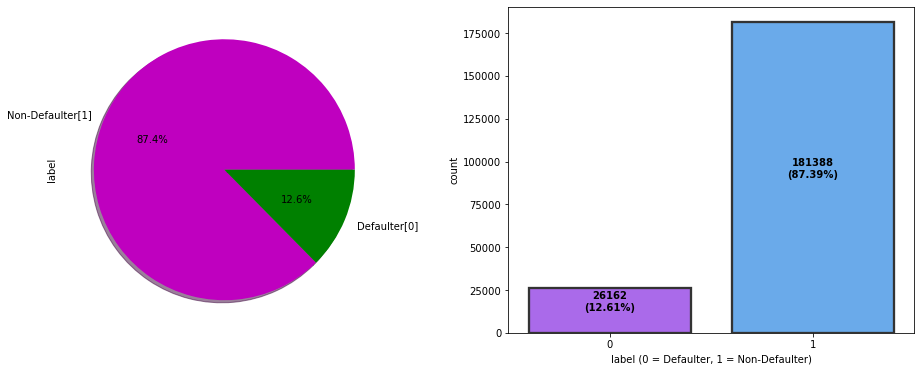

In [41]:
# Visualizing label whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}
print(df['label'].value_counts())
f,ax=plt.subplots(1,2,figsize=(16,6))
labels = ['Non-Defaulter[1]', 'Defaulter[0]']
colors = ["m", "green"]
df['label'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True,labels=labels,fontsize=10,colors=colors)
ax = sns.countplot('label', data=df, ax=ax[1],palette="cool_r",linewidth=2.3, edgecolor=".2")
index = 0
for i in ax.patches:
    height = round(i.get_height(),2)
    total = len(df["aon"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.xlabel('label (0 = Defaulter, 1 = Non-Defaulter)')
plt.show()

### Observations:
- From the above plots we can observe around 87% of the loan has been paid by the user and only 12% of the loan failed to pay. Also the dataset is highly imbalanced, so we need to work on that or else our model will be more biased towards success and make false interpretation.

## Distribution of skewness

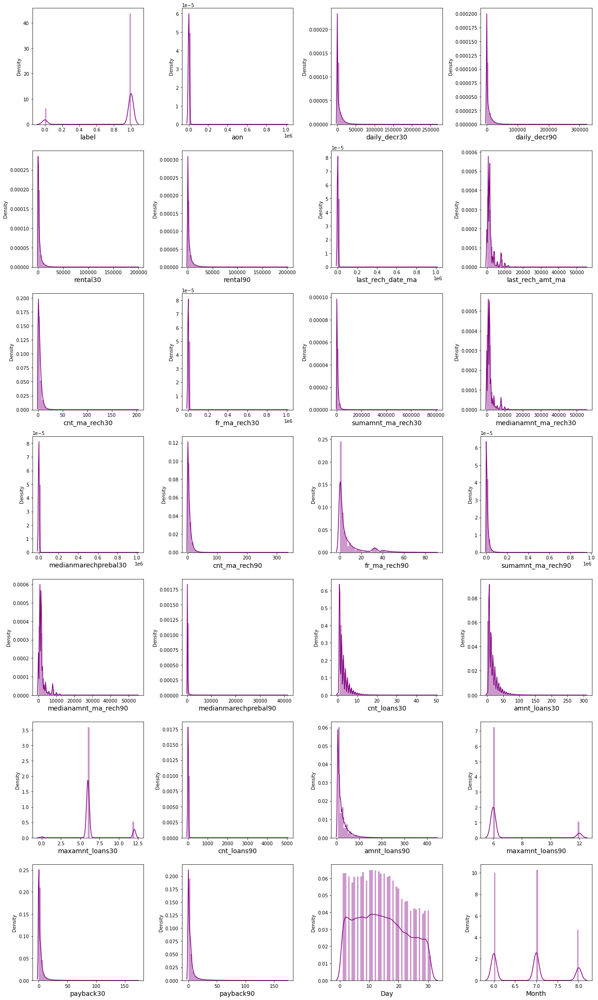

In [42]:
# Checking how the data has been distriubted in each column

plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in df:
    if plotnumber<=28:
        ax=plt.subplot(7,4,plotnumber)
        sns.distplot(df[column],color="purple")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

### Observations:
- From the above distribution plot, I can observe most of the columns are not normally distributed only Day column somewhat distributed normally.
- All the columns have skewness and are skewed to right since the mean is greater than the median in these columns. We need to remove this skewness before building our machine learning models.

## Bivariate Analysis (Comparing label with remaining features)

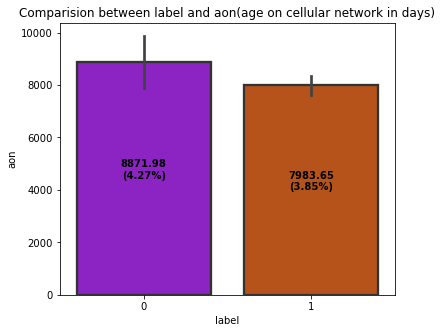

In [43]:
# Visualizing the age on cellular network in days and whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}
plt.figure(figsize=(6,5))
ax = sns.barplot(df['label'],df['aon'], data=df,palette="gnuplot",linewidth=2.3, edgecolor=".2");
index=0

for i in ax.patches:
    height = round(i.get_height(),2)
    total = len(df["aon"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Comparision between label and aon(age on cellular network in days)')
plt.show()

### Observations:
- From the above bar plot we can observe that the defaulter rate is higher where the user age on cellular network in days is high which has around 8871 counts (in days).

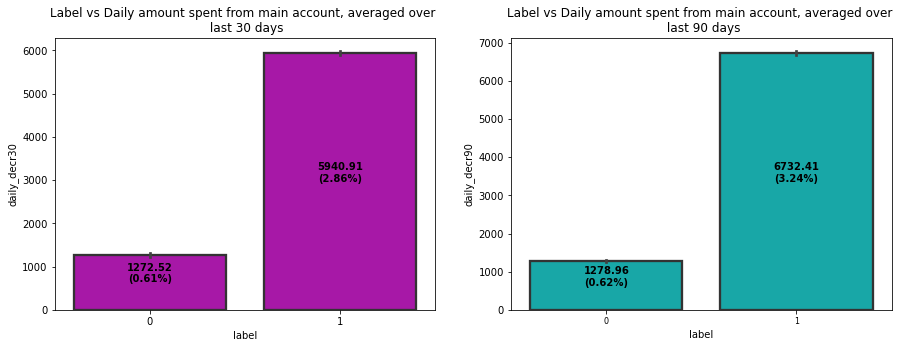

In [44]:
plt.figure(figsize=(15,5))

# Comparing label vs Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)
plt.subplot(1,2,1)
index=0
a=sns.barplot(x=df['label'],y=df['daily_decr30'],linewidth=2.3, edgecolor=".2",color="m")

for i in a.patches:
    height = round(i.get_height(),2)
    total = len(df["daily_decr30"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Daily amount spent from main account, averaged over \n last 30 days')

# Comparing label vs Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)
plt.subplot(1,2,2)
b=sns.barplot(x=df['label'],y=df['daily_decr90'],linewidth=2.3, edgecolor=".2",color="c")
index=0

for j in b.patches:
    height = round(j.get_height(),2)
    total = len(df["daily_decr90"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Daily amount spent from main account, averaged over \n last 90 days')

plt.xticks(fontsize='8')
plt.show()

### Observations:
- Most of the users who have paid back the credit amount within 5 days of issuing loan, they have high rate of daily amount spent from the account over last 30 days and 90 days which have the count around 5940 and 6732 respectively.
- The users who have spent daily amount from main account over last 30 days and 90 days have always paid back the loan amount within 5 days. Around 0.6% of the users failed to pay back the loan within due date.

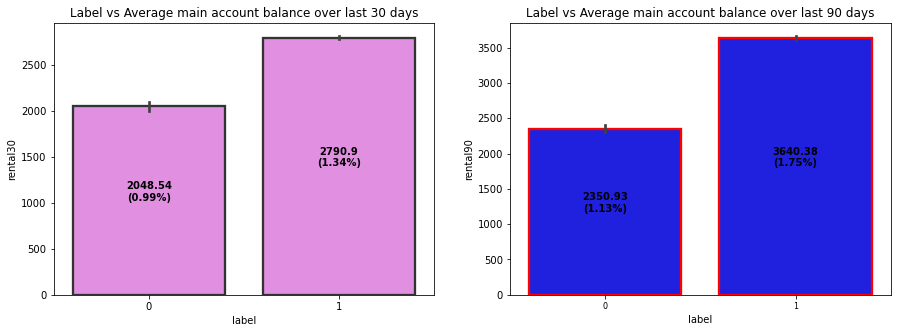

In [45]:
plt.figure(figsize=(15,5))

# Comparing label vs Average main account balance over last 30 days
plt.subplot(1,2,1)
index=0
a=sns.barplot(x=df['label'],y=df['rental30'],linewidth=2.3, edgecolor=".2",color="violet")

for i in a.patches:
    height = round(i.get_height(),2)
    total = len(df["rental30"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Average main account balance over last 30 days')

# Comparing label vs Average main account balance over last 90 days
plt.subplot(1,2,2)
b=sns.barplot(x=df['label'],y=df['rental90'],linewidth=2.3, edgecolor="r",color="blue")
index=0

for j in b.patches:
    height = round(j.get_height(),2)
    total = len(df["rental90"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Average main account balance over last 90 days')

plt.xticks(fontsize='8')
plt.show()

### Observations:

- Non defaulter users have average main account balance over last 30 days and 90 days which have count around 2790 & 3640 compared to defaulter.
- That means the users who have average main account balance always pays back the credit amounts within 5 days. And around 1% of the users either failed to payback the loan amount within the due date or they are not paying the loan.

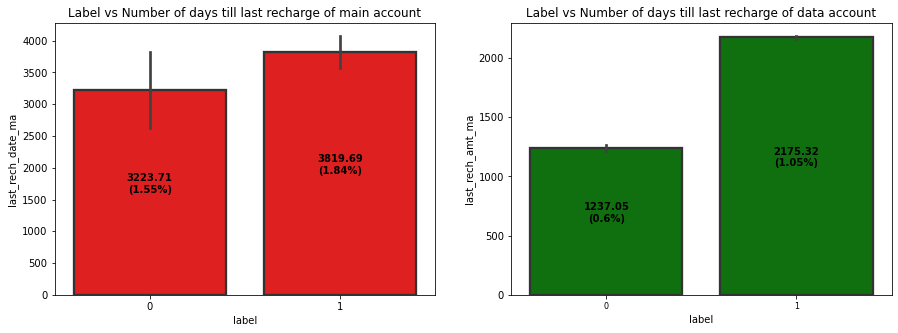

In [46]:
plt.figure(figsize=(15,5))

# Comparing label vs Number of days till last recharge of main account
plt.subplot(1,2,1)
index=0
a=sns.barplot(x=df['label'],y=df['last_rech_date_ma'],linewidth=2.3, edgecolor=".2",color="r")

for i in a.patches:
    height = round(i.get_height(),2)
    total = len(df["last_rech_date_ma"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Number of days till last recharge of main account')

# Comparing label vs Number of days till last recharge of data account
plt.subplot(1,2,2)
b=sns.barplot(x=df['label'],y=df['last_rech_amt_ma'],linewidth=2.3, edgecolor=".2",color="g")
index=0

for j in b.patches:
    height = round(j.get_height(),2)
    total = len(df["last_rech_amt_ma"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Number of days till last recharge of data account')

plt.xticks(fontsize='8')
plt.show()

### Observations:

- The users who have recharged their main account on time are most likely to pay back their loan amount within 5 days. Also some of the users who have not paid back their loan within 5 days they also recharged their main account on time.
- Looking at above plot of last_rech_amt_ma, we can say that if the amount of last recharge of main account is around 2000 then a greater number of people will pay back the loan amount.

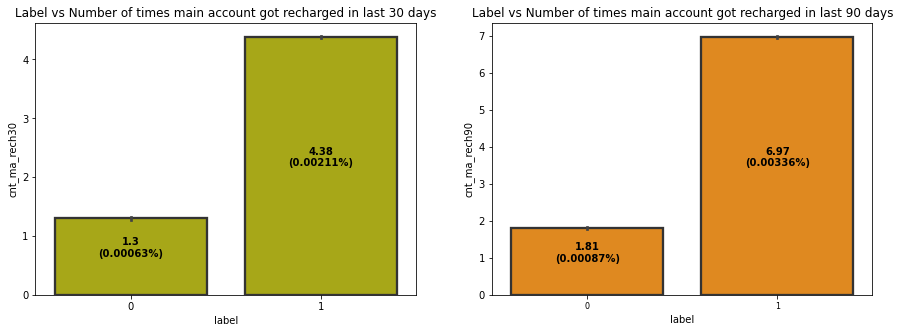

In [47]:
plt.figure(figsize=(15,5))

# Comparing label vs Number of times main account got recharged in last 30 days
plt.subplot(1,2,1)
index=0
a=sns.barplot(x=df['label'],y=df["cnt_ma_rech30"],linewidth=2.3, edgecolor=".2",color="y")

for i in a.patches:
    height = round(i.get_height(),2)
    total = len(df["cnt_ma_rech30"])
    percentage = f"{height}\n({round(height*100/total,5)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Number of times main account got recharged in last 30 days')

# Comparing label vs Number of times main account got recharged in last 90 days
plt.subplot(1,2,2)
b=sns.barplot(x=df['label'],y=df['cnt_ma_rech90'],linewidth=2.3, edgecolor=".2",color="darkorange")
index=0

for j in b.patches:
    height = round(j.get_height(),2)
    total = len(df["cnt_ma_rech90"])
    percentage = f"{height}\n({round(height*100/total,5)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Number of times main account got recharged in last 90 days')

plt.xticks(fontsize='8')
plt.show()

### Observations:

- The non defaulters got recharged their main account more than 4 times in last 30 days and defaulters used to recharge their main account 1 time.
- The users who have paid back their loan within 5 days have got recharged their main account upto 7 times in last 90 days and the users who have not been paid loan within due date, they have got recharged their main account twice in last 90 days.
- From both the plots we can say that the users who got recharged their main account maximum times, they are able to pay back their loan amount within 5 days compared to the users who got their main account recharged less than 2 times.

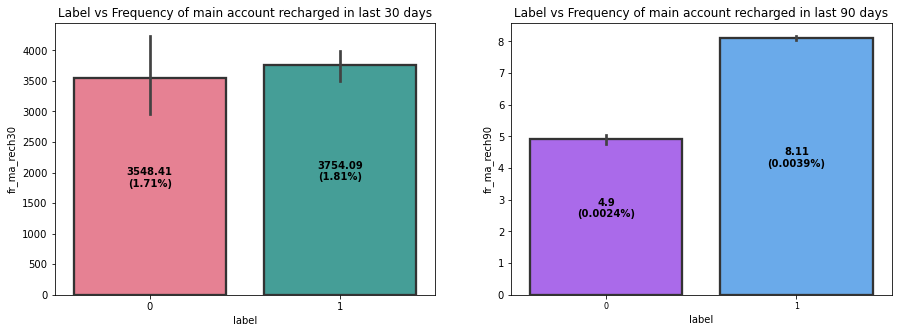

In [48]:
plt.figure(figsize=(15,5))

# Comparing label vs Frequency of main account recharged in last 30 days
plt.subplot(1,2,1)
index=0
a=sns.barplot(x=df['label'],y=df["fr_ma_rech30"],linewidth=2.3, edgecolor=".2",palette="husl")

for i in a.patches:
    height = round(i.get_height(),2)
    total = len(df["fr_ma_rech30"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Frequency of main account recharged in last 30 days')

# Comparing label vs Frequency of main account recharged in last 90 days
plt.subplot(1,2,2)
b=sns.barplot(x=df['label'],y=df['fr_ma_rech90'],linewidth=2.3, edgecolor=".2",palette="cool_r")
index=0

for j in b.patches:
    height = round(j.get_height(),2)
    total = len(df["fr_ma_rech90"])
    percentage = f"{height}\n({round(height*100/total,4)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Frequency of main account recharged in last 90 days')

plt.xticks(fontsize='8')
plt.show()

### Observations:

- The count of defaulters and non-defaulters is almost similar for the frequency of main account recharged in last 30 days. They didn't pay back the loan within 5 days. Which means there it is not contributing more for prediction.
- The frequency of main account recharged in last 90 days is increased for non-defaulters compared to defaulters.
- From the frequency of main account recharged in last 30 days & 90 days we have seen the users with low frequency are causing huge losses, company should implement some kind of strategies to reduce that like send SMS alerts for notification.

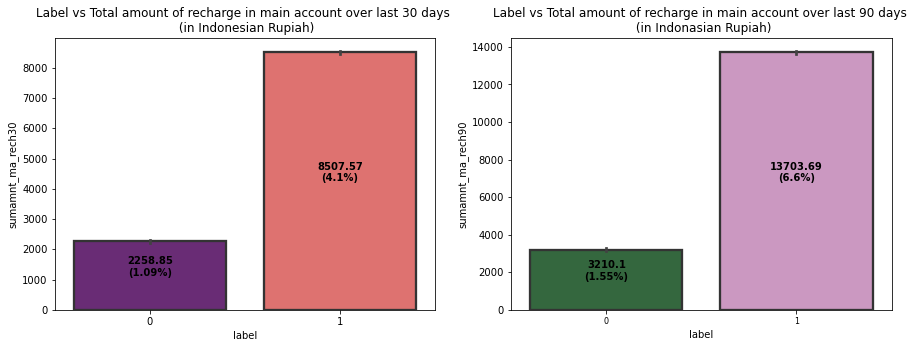

In [49]:
plt.figure(figsize=(15,5))

# Comparing label vs Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)
plt.subplot(1,2,1)
index=0
a=sns.barplot(x=df['label'],y=df["sumamnt_ma_rech30"],linewidth=2.3, edgecolor=".2",palette="magma")

for i in a.patches:
    height = round(i.get_height(),2)
    total = len(df["sumamnt_ma_rech30"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Total amount of recharge in main account over last 30 days \n (in Indonesian Rupiah)')

# Comparing label vs Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)
plt.subplot(1,2,2)
b=sns.barplot(x=df['label'],y=df['sumamnt_ma_rech90'],linewidth=2.3, edgecolor=".2",palette="cubehelix")
index=0

for j in b.patches:
    height = round(j.get_height(),2)
    total = len(df["sumamnt_ma_rech90"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Total amount of recharge in main account over last 90 days \n (in Indonasian Rupiah)')

plt.xticks(fontsize='8')
plt.show()

### Observations:

- The users who failed to pay back the loan within 5 days have less amount of recharge in their main account over last 30 days which is around 2000-2400 (in Indonesian Rupiah). And the users who paid back their loan within 5 days, they are recharging their main account more than 8000 (in Indonesian Rupiah) in last 30 days.
- The users who have paid their loan amount within 5 days have the total amount of recharge in their main account around 13700 (Indonesian Rupiah) in last 90 days while the defaulters have their total amount of recharge around 3200 (Indonesian Rupiah) over last 90 days.

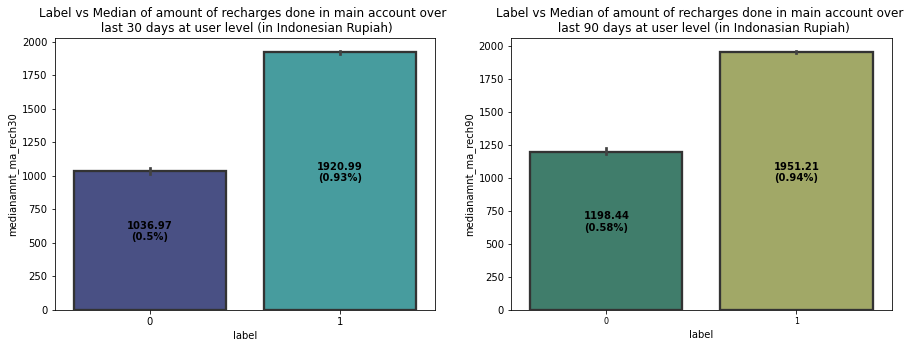

In [50]:
plt.figure(figsize=(15,5))

# Comparing label vs Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)
plt.subplot(1,2,1)
index=0
a=sns.barplot(x=df['label'],y=df["medianamnt_ma_rech30"],linewidth=2.3, edgecolor=".2",palette="mako")

for i in a.patches:
    height = round(i.get_height(),2)
    total = len(df["medianamnt_ma_rech30"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Median of amount of recharges done in main account over \n last 30 days at user level (in Indonesian Rupiah)')

# Comparing label vs Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)
plt.subplot(1,2,2)
b=sns.barplot(x=df['label'],y=df['medianamnt_ma_rech90'],linewidth=2.3, edgecolor=".2",palette="gist_earth")
index=0

for j in b.patches:
    height = round(j.get_height(),2)
    total = len(df["medianamnt_ma_rech90"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Median of amount of recharges done in main account over \n last 90 days at user level (in Indonasian Rupiah)')

plt.xticks(fontsize='8')
plt.show()

### Observations:

- The users who have done their median amount of recharge of 1920 (Indonesian Rupiah) in main account over last 30 days have successfully paid their credit amount within 5 days of issuing loan while the users who have done amount recharge of 1036 have failed to pay back the loan within due date.
- Similar to 30 days data, here also the users who have done their median amount recharge of 1950 in their main account over last 90 days they have paid back their credit amount within 5 days while the users having their median amount 1198 have not paid the loan within 5 days.

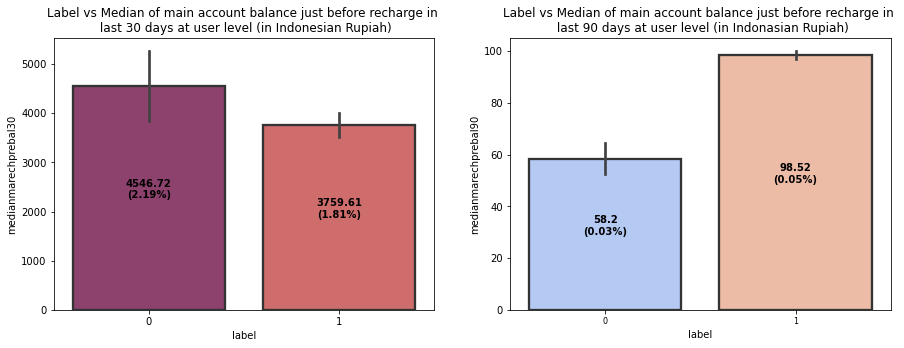

In [51]:
plt.figure(figsize=(15,5))

# Comparing label vs Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)
plt.subplot(1,2,1)
index=0
a=sns.barplot(x=df['label'],y=df["medianmarechprebal30"],linewidth=2.3, edgecolor=".2",palette="flare_r")

for i in a.patches:
    height = round(i.get_height(),2)
    total = len(df["medianmarechprebal30"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Median of main account balance just before recharge in \n last 30 days at user level (in Indonesian Rupiah)')

# Comparing label vs Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)
plt.subplot(1,2,2)
b=sns.barplot(x=df['label'],y=df['medianmarechprebal90'],linewidth=2.3, edgecolor=".2",palette="coolwarm")
index=0

for j in b.patches:
    height = round(j.get_height(),2)
    total = len(df["medianmarechprebal90"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Median of main account balance just before recharge in \n last 90 days at user level (in Indonasian Rupiah)')
plt.xticks(fontsize='8')
plt.show()

### Observations:

- In 30 days data, the median of main account balance for defaulters are around 4500 (Indonesian Rupiah) which is high compared to non-defaulters. Which means increasing median of main account balance just before recharge in last 30 days at user level, increasing the probability to being defaulter.
- In last 90 days data, the median of main account balance for non-defaulters are around 100 (Indonesian Rupiah) which is high compared to defaulters. Which means increasing median of main account balance just before recharge in last 90 days at user level, increasing the probability of being non-defaulters.

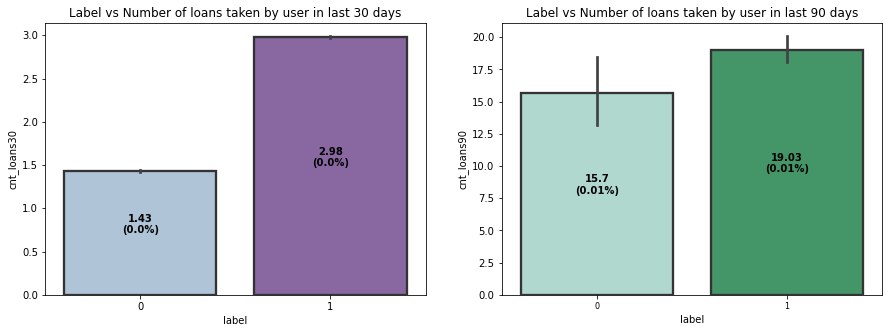

In [52]:
plt.figure(figsize=(15,5))

# Comparing label vs Number of loans taken by user in last 30 days
plt.subplot(1,2,1)
index=0
a=sns.barplot(x=df['label'],y=df["cnt_loans30"],linewidth=2.3, edgecolor=".2",palette="BuPu")

for i in a.patches:
    height = round(i.get_height(),2)
    total = len(df["cnt_loans30"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Number of loans taken by user in last 30 days')

# Comparing label vs Number of loans taken by user in last 90 days
plt.subplot(1,2,2)
b=sns.barplot(x=df['label'],y=df['cnt_loans90'],linewidth=2.3, edgecolor=".2",palette="BuGn")
index=0

for j in b.patches:
    height = round(j.get_height(),2)
    total = len(df["cnt_loans90"])
    percentage = f"{height}\n({round(height*100/total,2)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Number of loans taken by user in last 90 days')
plt.xticks(fontsize='8')
plt.show()

### Observations:

- Defaulters have taken 1 loan in last 30 days that is when a person takes loan amount for 1 time in last 30 days the chances of not paying back the credit amount are higher. And the users who have paid back the loan, they have taken maximum number of 3 loans in last 30 days data.
- In 90 days data, the number of loans taken by the defaulters are highly increasing also increasing the probability to being defaulter. Also, the number of loans taken by non-defaulters being decreased in last 90 days when compared to 30 days data.

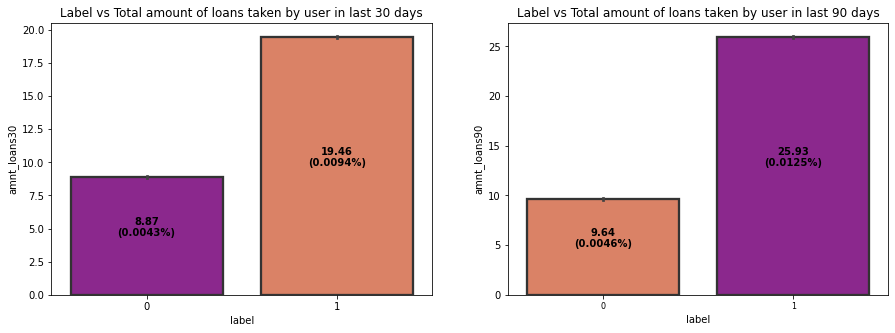

In [53]:
plt.figure(figsize=(15,5))

# Comparing label vs Total amount of loans taken by user in last 30 days
plt.subplot(1,2,1)
index=0
a=sns.barplot(x=df['label'],y=df["amnt_loans30"],linewidth=2.3, edgecolor=".2",palette="plasma")

for i in a.patches:
    height = round(i.get_height(),2)
    total = len(df["amnt_loans30"])
    percentage = f"{height}\n({round(height*100/total,4)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Total amount of loans taken by user in last 30 days')

# Comparing label vs Total amount of loans taken by user in last 90 days
plt.subplot(1,2,2)
b=sns.barplot(x=df['label'],y=df['amnt_loans90'],linewidth=2.3, edgecolor=".2",palette="plasma_r")
index=0

for j in b.patches:
    height = round(j.get_height(),2)
    total = len(df["amnt_loans90"])
    percentage = f"{height}\n({round(height*100/total,4)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Total amount of loans taken by user in last 90 days')
plt.xticks(fontsize='8')
plt.show()

### Observations:

- The total amount of loans taken by the defaulters in last 30 days are in the range of 7.5-10 while the non-defaulters have taken upto 20 loans in last 30 days.
- The total amount of loans taken by the defaulters in last 90 days are upto 10 and the non- defaulters have taken total amount of loans upto 26 in last 90 days.
- So, from the above plot we can conclude that when the total number of loans taken by the users in last 90 days is below 10, then the chances of not paying back the loan amount are high.

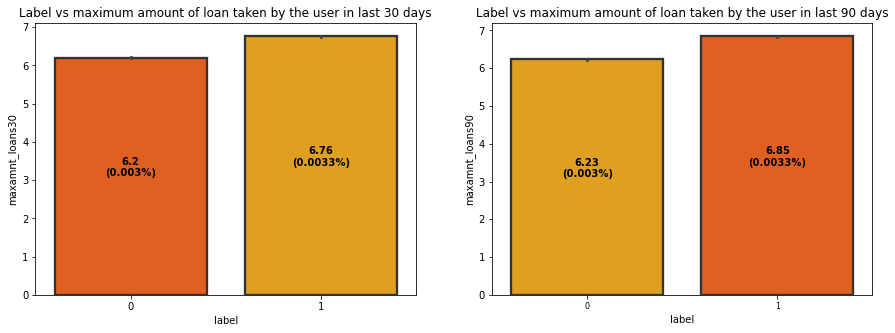

In [54]:
plt.figure(figsize=(15,5))

# Comparing label vs maximum amount of loan taken by the user in last 30 days
plt.subplot(1,2,1)
index=0
a=sns.barplot(x=df['label'],y=df["maxamnt_loans30"],linewidth=2.3, edgecolor=".2",palette="autumn")

for i in a.patches:
    height = round(i.get_height(),2)
    total = len(df["maxamnt_loans30"])
    percentage = f"{height}\n({round(height*100/total,4)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs maximum amount of loan taken by the user in last 30 days')

# Comparing label vs maximum amount of loan taken by the user in last 90 days
plt.subplot(1,2,2)
b=sns.barplot(x=df['label'],y=df['maxamnt_loans90'],linewidth=2.3, edgecolor=".2",palette="autumn_r")
index=0

for j in b.patches:
    height = round(j.get_height(),2)
    total = len(df["maxamnt_loans90"])
    percentage = f"{height}\n({round(height*100/total,4)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs maximum amount of loan taken by the user in last 90 days')
plt.xticks(fontsize='8')
plt.show()

### Observations:

- The maximum amount of loan taken by the user in last 30 days and 90 days are almost same. The maximum amount of loan taken by the defaulters and non-defaulters are upto 6 and 7 respectively in last 30 and 90 days.
- So from the plot we can say that whenever the user takes the maximum loan amount of 6, then only some users may not pay back the loan amount

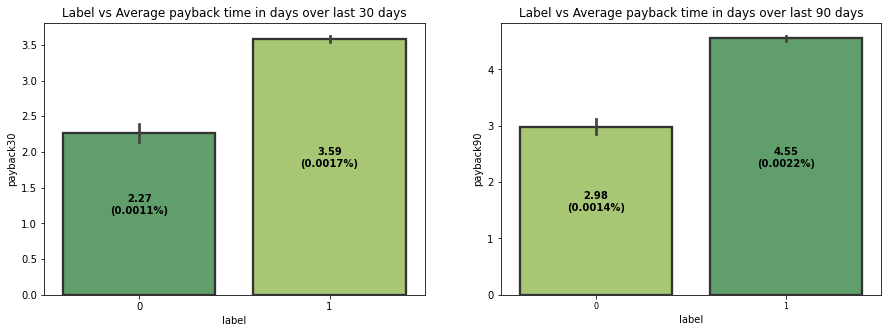

In [55]:
plt.figure(figsize=(15,5))

# Comparing label vs Average payback time in days over last 30 days
plt.subplot(1,2,1)
index=0
a=sns.barplot(x=df['label'],y=df["payback30"],linewidth=2.3, edgecolor=".2",palette="summer")

for i in a.patches:
    height = round(i.get_height(),2)
    total = len(df["payback30"])
    percentage = f"{height}\n({round(height*100/total,4)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Average payback time in days over last 30 days')

# Comparing label vs Average payback time in days over last 90 days
plt.subplot(1,2,2)
b=sns.barplot(x=df['label'],y=df['payback90'],linewidth=2.3, edgecolor=".2",palette="summer_r")
index=0

for j in b.patches:
    height = round(j.get_height(),2)
    total = len(df["payback90"])
    percentage = f"{height}\n({round(height*100/total,4)}%)"
    plt.text(index,height/2,percentage,ha="center",fontweight="bold")
    index += 1
plt.title('Label vs Average payback time in days over last 90 days')
plt.xticks(fontsize='8')
plt.show()

### Observations:

- The defaulters are paying back their loan in an average of 2-2.5 days and the non-defaulters are paying back their loan in an average of 3 days over last 30 days.
- The defaulters in last 90 days, are paying back their loan in an average of 3 days and non-defaulters are paying back their loan in 4-5 days over last 90 days.
- It is seen from the plot that when an average payback time is below 3 days over last 30 & 90 days, then defaulters' rate is high.

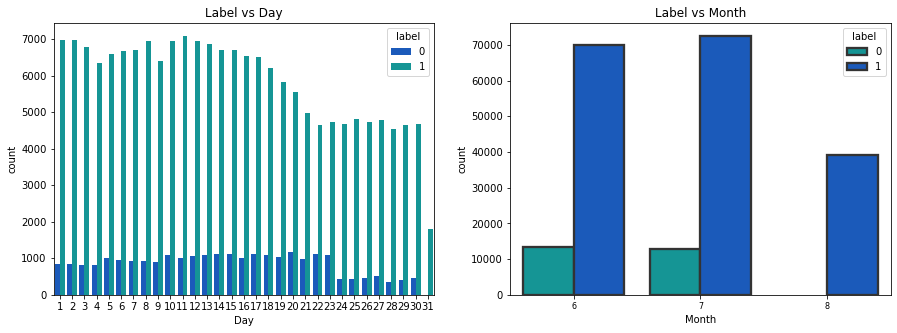

In [56]:
plt.figure(figsize=(15,5))

# Comparing label vs Day
plt.subplot(1,2,1)
sns.countplot(x=df['Day'],hue=df["label"],linewidth=2.3,palette="winter")
plt.title('Label vs Day')

# Comparing label vs Average payback time in days over last 90 days
plt.subplot(1,2,2)
sns.countplot(x=df['Month'],hue=df['label'],linewidth=2.3, edgecolor=".2",palette="winter_r")
plt.title('Label vs Month')
plt.xticks(fontsize='8')
plt.show()

### Observations:

- The users who have taken loans in the month of august, they seem paying back their loan within 5 days.

## Identifying the outliers

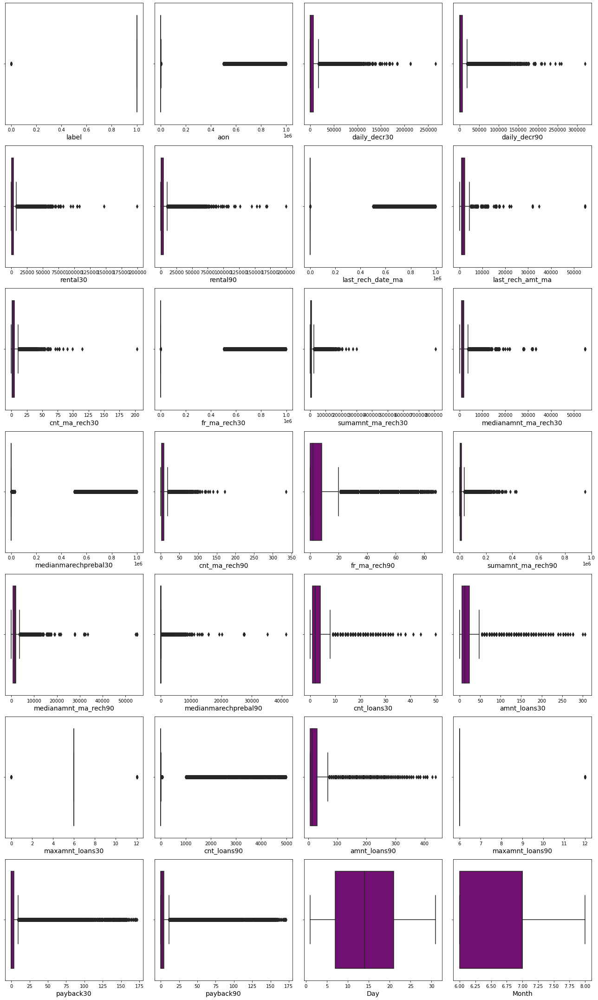

In [57]:
# Identifying the outliers using boxplot
plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in df:
    if plotnumber<=28:
        ax=plt.subplot(7,4,plotnumber)
        sns.boxplot(df[column],color="purple")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

From the above box plot we can notice the outliers present in all the features except Day and Month columns. Let's remove the outliers in these columns except Day, Month and label. Since label is our target columns we should not loose any data by removing outliers in this column.

## Removing outliers
## i) Zscore method

In [58]:
# Feature containing outliers
features= df[['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90',
       'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30',
       'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30',
       'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90',
       'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90',
       'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90']]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

In [59]:
# Creating new dataframe by setting z to 3
new_df = df[(z<3).all(axis=1)] 
new_df

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Day,Month
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,2,12,6.0,2.0,12,6,29.000000,29.000000,20,7
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,1,12,12.0,1.0,12,12,0.000000,0.000000,10,8
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,1,6,6.0,1.0,6,6,0.000000,0.000000,19,8
3,1,241.0,21.228000,21.228000,159.42,159.42,41.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,2,12,6.0,2.0,12,6,0.000000,0.000000,6,6
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,7,42,6.0,7.0,42,6,2.333333,2.333333,22,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,1,404.0,151.872333,151.872333,1089.19,1089.19,1.0,4048,3,2.0,10404.0,3178.0,91.81,3,2,10404,3178.0,91.81,2,12,6.0,2.0,12,6,1.000000,1.000000,17,6
209589,1,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,773,4,1.0,3092.0,773.0,161.30,6,2,4038,773.0,111.80,3,18,6.0,3.0,18,6,1.000000,1.000000,12,6
209590,1,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,1539,5,8.0,9334.0,1539.0,51.13,11,5,18592,1539.0,47.13,4,42,12.0,6.0,54,12,4.000000,3.833333,29,7
209591,1,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,773,5,4.0,12154.0,773.0,164.00,6,4,17941,2410.5,100.00,2,18,12.0,3.0,24,12,0.000000,10.500000,25,7


This is the new dataframe after removing the outliers. Here we have removed the outliers whose Zscore is less than 3.

In [62]:
# Checking the shape of dataset before and after removing outliers
print("Shape of dataset before removing outliers:", df.shape)
print("Shape of dataset after removing outliers:", new_df.shape)

Shape of dataset before removing outliers: (207550, 28)
Shape of dataset after removing outliers: (170071, 28)


In [63]:
# Checking the the data loss after removing outliers
data_loss = (207550-170071)/207550*100
data_loss

18.05781739339918

By using Zscore I am losing around 18% of data which is not acceptable. The acceptable range of data loss is 7-8%. So let's try to remove outliers using IQR method.

## ii) IQR (Inter Quartile Range) method

In [64]:
# 1st quantile
Q1=features.quantile(0.25)

# 3rd quantile
Q3=features.quantile(0.75)

# IQR
IQR=Q3 - Q1

df1=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [65]:
print("Shape of data after using IQR method:", df1.shape)

Shape of data after using IQR method: (78654, 28)


In [66]:
# Checking the the data loss after removing outliers
data_loss = (207550-78654)/207550*100
data_loss

62.103589496506864

By using Zscore and IQR method I am losing large amount of data, let's use percentile method to remove the outliers by setting the dataloss to 2%.

## iii) Percentile Method

In [67]:
#Removing outliers using percentile method in train dataset
for col in features:
    if df[col].dtypes != 'object':
        percentile = df[col].quantile([0.01,0.98]).values
        df[col][df[col]<=percentile[0]]=percentile[0]
        df[col][df[col]>=percentile[1]]=percentile[1]

I have successfully removed the outliers present in dataset using percentile method.

## Checking for skewness in dataset

In [68]:
# Checking the skewness
df.skew()

label                  -2.253346
aon                     0.934791
daily_decr30            1.978547
daily_decr90            2.098290
rental30                2.117210
rental90                2.205817
last_rech_date_ma       2.565623
last_rech_amt_ma        2.016661
cnt_ma_rech30           1.410702
fr_ma_rech30            1.703431
sumamnt_ma_rech30       1.749207
medianamnt_ma_rech30    2.122065
medianmarechprebal30    2.799234
cnt_ma_rech90           1.566573
fr_ma_rech90            1.987801
sumamnt_ma_rech90       1.863681
medianamnt_ma_rech90    2.143777
medianmarechprebal90    2.631175
cnt_loans30             1.597669
amnt_loans30            1.752260
maxamnt_loans30         1.634976
cnt_loans90             2.000454
amnt_loans90            1.910837
maxamnt_loans90         2.224471
payback30               2.635055
payback90               2.826565
Day                     0.184762
Month                   0.358219
dtype: float64

Here we can observe the skewness present in all the columns except Day and Month. Since label is our target variable no need to remove skewness in this column as well. Lets remove the columns having skewness more than +0.5 & -0.5 using power transformation method(yeo-johnson method).

## Removing skewness using yeo-johnson method

In [69]:
# Removing skewness using yeo-johnson  method to get better prediction
features= ['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90',
       'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30',
       'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30',
       'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90',
       'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90',
       'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90']

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [70]:
df[features] = scaler.fit_transform(df[features].values)
df[features]

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90
0,-0.698192,0.502635,0.480196,-0.815119,-0.801254,-0.334457,0.085229,-0.297080,1.714875,-0.194777,0.210746,-0.733979,-0.593082,1.343046,-0.458284,0.150784,-0.861205,0.061605,0.000696,-0.279514,-0.196942,-0.210633,-0.383418,1.790975,1.826511
1,0.387246,1.123583,1.076317,0.794042,0.630619,1.542566,1.549424,-0.817015,-1.126969,0.218868,1.698387,0.382366,-1.036095,-1.206521,-0.094601,1.758611,0.360413,-1.073631,0.000696,2.331154,-1.139781,-0.210633,2.607936,-0.945737,-1.027712
2,0.041209,0.187550,0.173246,-0.123498,-0.219266,-0.005757,0.085229,-0.817015,-1.126969,-0.562266,0.210746,0.434698,-1.036095,-1.206521,-0.784083,0.150784,0.419599,-1.073631,-1.136978,-0.279514,-1.139781,-1.195396,-0.383418,-0.945737,-1.027712
3,-0.819499,-1.120125,-1.117515,-0.947896,-0.995637,2.044467,-0.297189,-1.677889,-1.126969,-1.901468,-1.964699,-1.653437,-1.036095,-1.206521,-0.974270,-0.261525,-1.290842,0.061605,0.000696,-0.279514,-0.196942,-0.210633,-0.383418,-0.945737,-1.027712
4,0.754265,-0.582302,-0.581745,-0.008841,-0.112338,0.235710,0.461086,1.012640,0.158382,1.322032,0.590987,-0.059496,0.662689,-0.060101,1.015503,0.813732,-0.014428,1.558211,1.446464,-0.279514,1.224605,1.155690,-0.383418,0.625541,0.413261
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,-0.278836,-0.579762,-0.579232,-0.014038,-0.117181,-0.833241,1.082242,0.079341,0.158382,0.685801,0.933723,0.645899,-0.272179,-0.060101,0.312805,0.929319,0.660085,0.061605,0.000696,-0.279514,-0.196942,-0.210633,-0.383418,0.077050,-0.119516
209589,0.924703,-0.980848,-0.978014,0.268899,0.145770,0.235710,-0.438006,0.375692,-0.272800,-0.192092,-0.316200,1.035209,0.368101,-0.060101,-0.310512,-0.412329,0.812459,0.646390,0.550349,-0.279514,0.325965,0.290132,-0.383418,0.077050,-0.119516
209590,0.844267,1.112351,1.067842,1.155109,1.285978,-0.005757,0.085229,0.620705,1.117370,0.592674,0.210746,0.272694,1.005387,0.512038,0.795251,0.150784,0.181414,1.004987,1.446464,2.331154,1.083867,1.369033,2.607936,0.967619,0.741195
209591,1.608771,1.137984,1.093184,-0.531384,-0.171704,-0.334457,-0.438006,0.620705,0.639283,0.824974,-0.316200,1.047137,0.368101,0.371371,0.763085,0.606688,0.725548,0.061605,0.550349,2.331154,0.325965,0.610708,2.607936,-0.945737,1.349216


In [71]:
# Checking skewness after using yeo-johnson method
df[features].skew()

aon                    -0.059261
daily_decr30           -0.137650
daily_decr90           -0.127335
rental30               -0.062522
rental90               -0.062946
last_rech_date_ma       0.043916
last_rech_amt_ma       -0.106643
cnt_ma_rech30          -0.010536
fr_ma_rech30            0.131926
sumamnt_ma_rech30      -0.369147
medianamnt_ma_rech30   -0.237104
medianmarechprebal30   -0.046085
cnt_ma_rech90          -0.012334
fr_ma_rech90            0.141522
sumamnt_ma_rech90      -0.266852
medianamnt_ma_rech90   -0.101431
medianmarechprebal90   -0.029793
cnt_loans30             0.219771
amnt_loans30            0.146844
maxamnt_loans30         0.381337
cnt_loans90             0.201541
amnt_loans90            0.129122
maxamnt_loans90         2.224471
payback30               0.278283
payback90               0.193524
dtype: float64

We can observe the skewness has almost been reduced in all the columns.

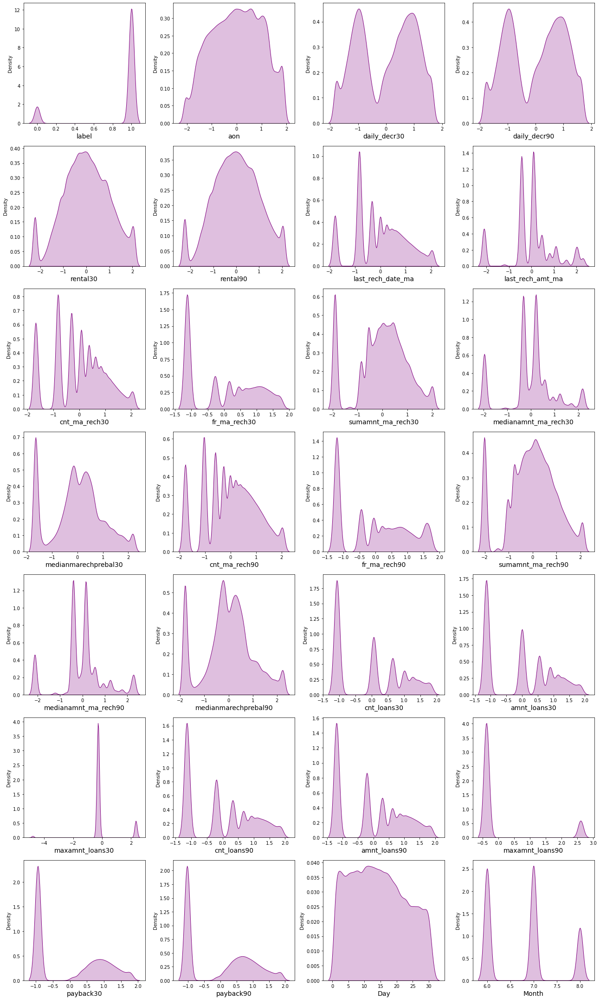

In [72]:
# Checking how the data has been distriubted in each column after removing skewness
plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in df:
    if plotnumber<=28:
        ax=plt.subplot(7,4,plotnumber)
        sns.distplot(df[column],color="purple",kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

From the above dist plots we can see that the data has been distributes normally in some of the columns and the skewness is also reduced compared to the previous data.

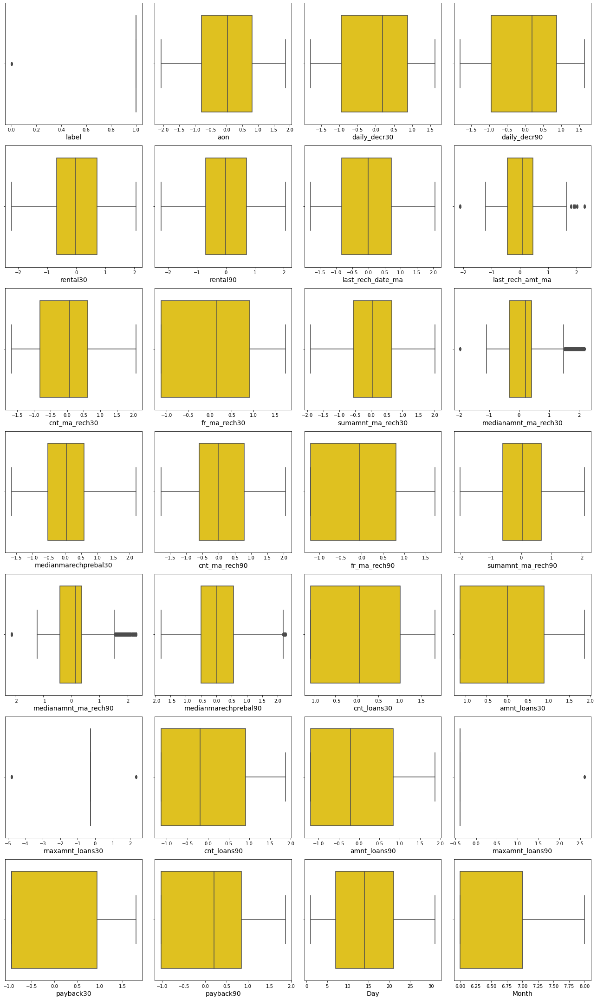

In [73]:
# Checking the outliers after using percentile method
plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in df:
    if plotnumber<=28:
        ax=plt.subplot(7,4,plotnumber)
        sns.boxplot(df[column],color="gold")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

Its good to see that the outliers are almost removed in many columns after using percentile method and after removing skewness.

After cleaning the data we got only numerical data throughout the dataset. Since all the features in the dataset are numerical so no need to encode the data.

## Correlation between the label and features using HEAT map in dataset

In [74]:
# Checking the correlation between features and the target
cor = df.corr()
cor

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Day,Month
label,1.000000,0.097208,0.266444,0.268775,0.142205,0.155661,0.064305,0.262083,0.347162,0.243564,0.361711,0.279565,0.266752,0.363878,0.221068,0.370102,0.252702,0.257523,0.276082,0.291492,0.075952,0.293548,0.309039,0.101247,0.236554,0.244596,0.008241,0.151680
aon,0.097208,1.000000,0.117096,0.117840,0.084111,0.092045,0.062278,0.097625,0.038139,0.070579,0.081316,0.097596,0.057144,0.059595,0.075794,0.098734,0.102863,0.057758,0.081993,0.087453,0.028230,0.116259,0.118862,0.038690,0.080812,0.111218,0.016277,0.088821
daily_decr30,0.266444,0.117096,1.000000,0.998435,0.585638,0.641529,0.123072,0.375006,0.498882,0.297504,0.556595,0.388856,0.274683,0.629258,0.219986,0.664160,0.364479,0.243450,0.398639,0.469091,0.329454,0.530528,0.585352,0.406822,0.336835,0.413587,-0.005543,0.819261
daily_decr90,0.268775,0.117840,0.998435,1.000000,0.586036,0.646414,0.126662,0.374533,0.494780,0.296841,0.551778,0.386170,0.273615,0.632905,0.221059,0.667208,0.364683,0.244228,0.394111,0.465628,0.329547,0.532191,0.587372,0.409956,0.334597,0.414701,-0.012356,0.832069
rental30,0.142205,0.084111,0.585638,0.586036,1.000000,0.974866,0.055640,0.284950,0.457289,0.248717,0.483215,0.321685,0.224043,0.513308,0.162761,0.520826,0.273283,0.180335,0.351445,0.391547,0.229190,0.426924,0.457818,0.279351,0.313625,0.349548,0.104843,0.420241
rental90,0.155661,0.092045,0.641529,0.646414,0.974866,1.000000,0.086931,0.294793,0.450131,0.251783,0.473789,0.314687,0.221703,0.541062,0.176180,0.546615,0.282589,0.189007,0.344863,0.391728,0.243832,0.447225,0.482003,0.306454,0.311970,0.368359,0.088389,0.505436
last_rech_date_ma,0.064305,0.062278,0.123072,0.126662,0.055640,0.086931,1.000000,0.518141,-0.016311,0.062349,0.120058,0.330315,0.193080,0.097029,0.220031,0.250383,0.507557,0.338033,-0.076541,-0.067983,-0.004410,-0.027212,-0.022283,0.016073,-0.094731,-0.020555,0.032959,0.070518
last_rech_amt_ma,0.262083,0.097625,0.375006,0.374533,0.284950,0.294793,0.518141,1.000000,0.324761,0.274736,0.656182,0.815169,0.428939,0.375053,0.337799,0.702025,0.902231,0.490820,0.184620,0.221013,0.147657,0.216948,0.246442,0.185654,0.147133,0.184311,0.060133,0.152274
cnt_ma_rech30,0.347162,0.038139,0.498882,0.494780,0.457289,0.450131,-0.016311,0.324761,1.000000,0.416578,0.857169,0.414204,0.483347,0.921898,0.221113,0.780681,0.289736,0.390532,0.732750,0.738661,0.176343,0.710656,0.723829,0.194797,0.546307,0.488019,0.097776,0.199803
fr_ma_rech30,0.243564,0.070579,0.297504,0.296841,0.248717,0.251783,0.062349,0.274736,0.416578,1.000000,0.459433,0.381396,0.304847,0.409782,0.616698,0.422094,0.294093,0.225942,0.339864,0.349147,0.090392,0.351095,0.362987,0.102128,0.415946,0.394390,0.081552,0.135763


This gives the correlation between the denpendent and independent variables. We can visualize this by plotting heat map.

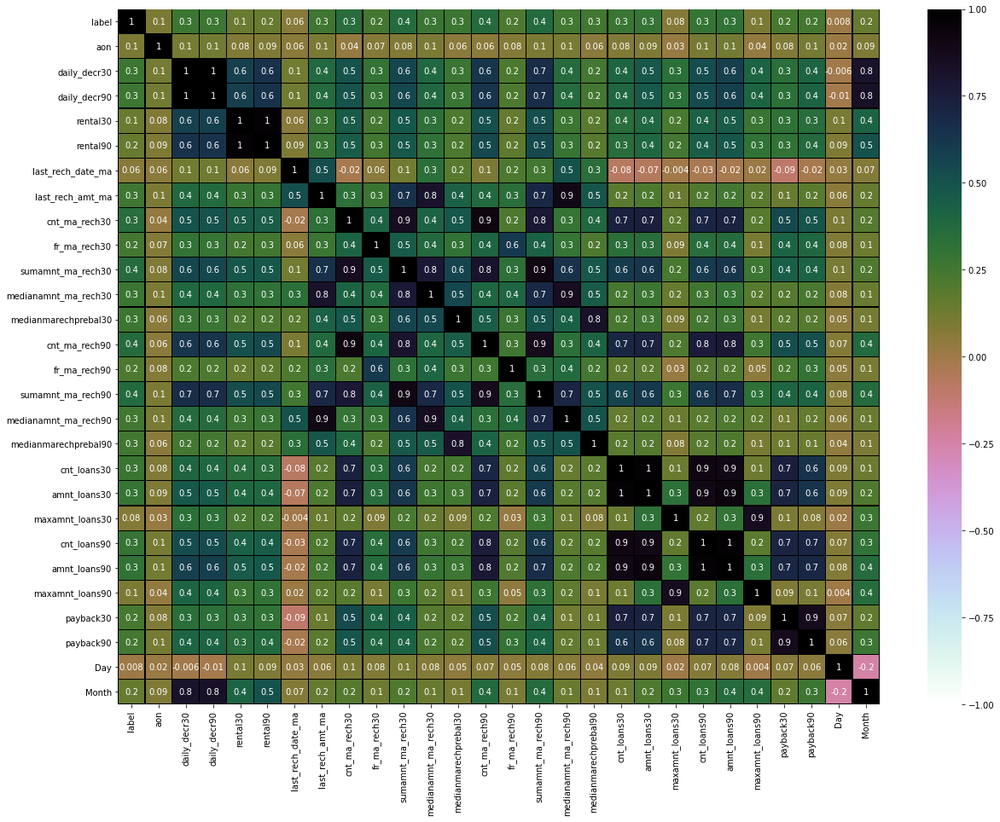

In [75]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(20,15))    
sns.heatmap(df.corr(),linewidths=.1,vmin=-1, vmax=1,fmt='.1g',linecolor="black",annot=True,cmap="cubehelix_r",annot_kws={'size':10})
plt.yticks(rotation=0);

This heatmap shows the correlation matrix of the data. We can observe the relation between one feature to other and relation between features and label. Here we can notice there is no strong relation between features and label.
Dark shades are highly positively correlated with the label and light shades are highly negatively correlated with the label.
The features
- sumamnt_ma_rech30: Total amount of recharge in main account over last 30 days (in Indonasian Rupiah)
- sumamnt_ma_rech90:Total amount of recharge in main account over last 90 days (in Indonasian Rupiah-)
- daily_decr30: Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)
- daily_decr30: Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)
- cnt_ma_rech30: Number of times main account got recharged in last 30 days
- cnt_ma_rech90: Number of times main account got recharged in last 90 days
- cnt_loans30 & cnt_loans90: Number of loans taken by user in last 30 days & 90 days respectively.
- amnt_loans30 & amnt_loans90: Total amount of loans taken by user in last 30 days and 90 days

These features have somewhat strong correlation with the label of defaulters and non-defaulters data. Also, we can observe there are no negative correlation between label and features. Most of the features are correlated with each other.

In [76]:
cor['label'].sort_values(ascending=False)

label                   1.000000
sumamnt_ma_rech90       0.370102
cnt_ma_rech90           0.363878
sumamnt_ma_rech30       0.361711
cnt_ma_rech30           0.347162
amnt_loans90            0.309039
cnt_loans90             0.293548
amnt_loans30            0.291492
medianamnt_ma_rech30    0.279565
cnt_loans30             0.276082
daily_decr90            0.268775
medianmarechprebal30    0.266752
daily_decr30            0.266444
last_rech_amt_ma        0.262083
medianmarechprebal90    0.257523
medianamnt_ma_rech90    0.252702
payback90               0.244596
fr_ma_rech30            0.243564
payback30               0.236554
fr_ma_rech90            0.221068
rental90                0.155661
Month                   0.151680
rental30                0.142205
maxamnt_loans90         0.101247
aon                     0.097208
maxamnt_loans30         0.075952
last_rech_date_ma       0.064305
Day                     0.008241
Name: label, dtype: float64

Here we can observe the positive correlation between features and label clearly.

## Visualizing the correlation between label and features using bar plot

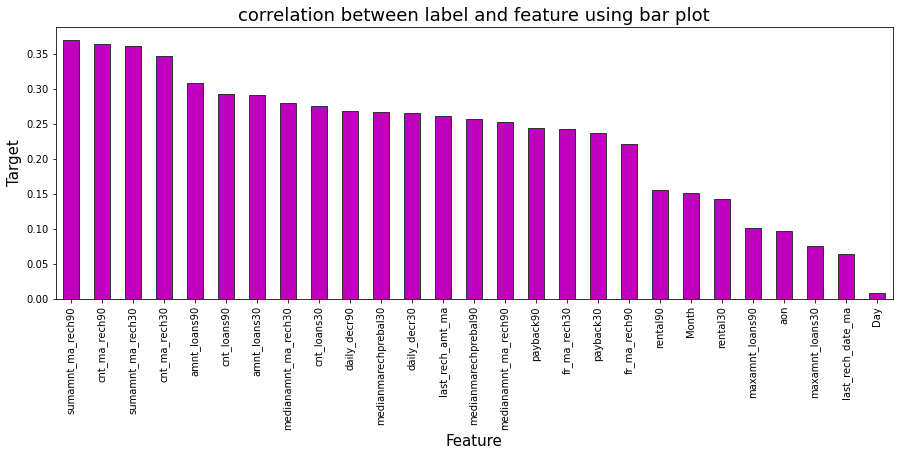

In [78]:
plt.figure(figsize=(15,5))
df.corr()['label'].sort_values(ascending=False).drop(['label']).plot(kind='bar',color='m',edgecolor=".2")
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('correlation between label and feature using bar plot',fontsize=18)
plt.show()

From the bar plot we can clearly observe the positive correlation between the label and features. Here the column Day is less correlated with the label compared to others, we can drop these columns if necessary but for now let's keep it as it is.

## Separating the feature and label into x and y

In [79]:
x = df.drop("label", axis=1)
y = df["label"]

In [80]:
# Dimension of x and y
x.shape, y.shape

((207550, 27), (207550,))

Since skewness present in one column and some of the columns have outliers and the data is not distributed normally in some of the columns, so let's use MinMaxScaler method to scale the data.

## Feature Scaling Using MinMaxScaler

In [81]:
from sklearn.preprocessing import MinMaxScaler

mms=MinMaxScaler()
x = pd.DataFrame(mms.fit_transform(x), columns=x.columns)
x

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Day,Month
0,0.348970,0.670388,0.661447,0.330465,0.335513,0.378383,0.498865,0.368297,0.990879,0.435328,0.523791,0.239198,0.307937,0.870329,0.378257,0.515526,0.231859,0.392540,0.378664,0.633603,0.312710,0.321358,0.0,1.000000,0.984592,0.633333,0.5
1,0.625204,0.851665,0.834288,0.706042,0.668524,0.865622,0.831756,0.229617,0.000000,0.540837,0.881977,0.529616,0.191924,0.000000,0.466745,0.879174,0.533388,0.000000,0.378664,1.000000,0.000000,0.321358,1.0,0.000000,0.000000,0.300000,1.0
2,0.537141,0.578404,0.572448,0.491889,0.470866,0.463708,0.498865,0.229617,0.000000,0.341592,0.523791,0.543230,0.191924,0.000000,0.298987,0.515526,0.547997,0.000000,0.000000,0.633603,0.000000,0.000000,0.0,0.000000,0.000000,0.600000,1.0
3,0.318099,0.196647,0.198199,0.299475,0.290305,0.995905,0.411921,0.000000,0.000000,0.000000,0.000000,0.000000,0.191924,0.000000,0.252713,0.422273,0.125813,0.392540,0.378664,0.633603,0.312710,0.321358,0.0,0.000000,0.000000,0.166667,0.0
4,0.718606,0.353656,0.353543,0.518649,0.495734,0.526388,0.584318,0.717633,0.448169,0.822222,0.615344,0.414665,0.636788,0.391346,0.736845,0.665467,0.440867,0.910035,0.859875,0.633603,0.784192,0.767230,0.0,0.574148,0.497077,0.700000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207545,0.455692,0.354398,0.354271,0.517436,0.494608,0.248909,0.725540,0.468699,0.448169,0.659938,0.697866,0.598174,0.391972,0.391346,0.565871,0.691610,0.607355,0.392540,0.378664,0.633603,0.312710,0.321358,0.0,0.373728,0.313291,0.533333,0.0
207546,0.761981,0.237307,0.238647,0.583474,0.555762,0.526388,0.379906,0.547743,0.297827,0.436013,0.396916,0.699454,0.559644,0.391346,0.414212,0.388165,0.644966,0.594747,0.561611,0.633603,0.486141,0.484772,0.0,0.373728,0.313291,0.366667,0.0
207547,0.741511,0.848386,0.831831,0.790314,0.820941,0.463708,0.498865,0.613094,0.782544,0.636184,0.523791,0.501085,0.726532,0.586653,0.683256,0.515526,0.489206,0.718742,0.859875,1.000000,0.737513,0.836850,1.0,0.699144,0.610201,0.933333,0.5
207548,0.936069,0.855869,0.839179,0.396689,0.481927,0.378383,0.379906,0.613094,0.615847,0.695437,0.396916,0.702557,0.559644,0.538635,0.675429,0.618639,0.623514,0.392540,0.561611,1.000000,0.486141,0.589386,1.0,0.000000,0.819944,0.800000,0.5


We have scaled the data using MinMaxScalar method to overcome with the issue of data biasness.

In [82]:
y.value_counts()

1    181388
0     26162
Name: label, dtype: int64

Since we have class imbalancing issue in our dataset, let's use oversampling method to balance the data

## Oversampling

In [83]:
# Oversampling the data by adding samples to make all the categorical quality values same.
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x,y = SM.fit_resample(x,y)

SMOTE is the oversampling mechanism that we are using to ensure that all the categories present in our target label have the same value.

In [84]:
y.value_counts()

0    181388
1    181388
Name: label, dtype: int64

After applying over sampling we are once again listing the values of our label column to cross verify the updated information. Here we see that we have successfully resolved the class imbalance problem and now all the categories have same data ensuring that the machine learning model does not get biased towards one category.

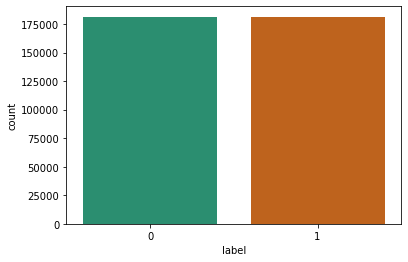

In [85]:
# Visualizing the data after oversampling
sns.countplot(y,palette="Dark2")
plt.show()

We can clearly observe the balanced data now.

## Finding best random state for building Classification Models

In [87]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    DTC = DecisionTreeClassifier()
    DTC.fit(x_train, y_train)
    pred = DTC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9140885576984922  on Random_state  43


Great so with the help of random state selection process we have found our random state to be 43 amongst 1-1000 with best accuracy as 91.40%.

## Creating new training and testing data sets

In [88]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

I am taking 30 percent of the complete dataset for training purpose and the remaining 70 percent with be used to train the machine learning models using the random state.

### Machine Learning Model for Classification with Evaluation Metrics

In [89]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier, BaggingClassifier
from xgboost import XGBClassifier as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score, roc_auc_score
from sklearn.model_selection import cross_val_score

## Feature Importance

In [90]:
# Lets chkeck the feature importance using Random Forest Regressor

RFC = RandomForestClassifier()
RFC.fit(x_train, y_train)
importances = pd.DataFrame({'Features':x.columns, 'Importance':np.round(RFC.feature_importances_,3)})
importances = importances.sort_values('Importance', ascending=False).set_index('Features')
importances

,Importance
Features,
cnt_ma_rech90,0.112
Day,0.077
sumamnt_ma_rech90,0.073
daily_decr90,0.068
Month,0.067
sumamnt_ma_rech30,0.063
daily_decr30,0.059
cnt_ma_rech30,0.057
last_rech_date_ma,0.037


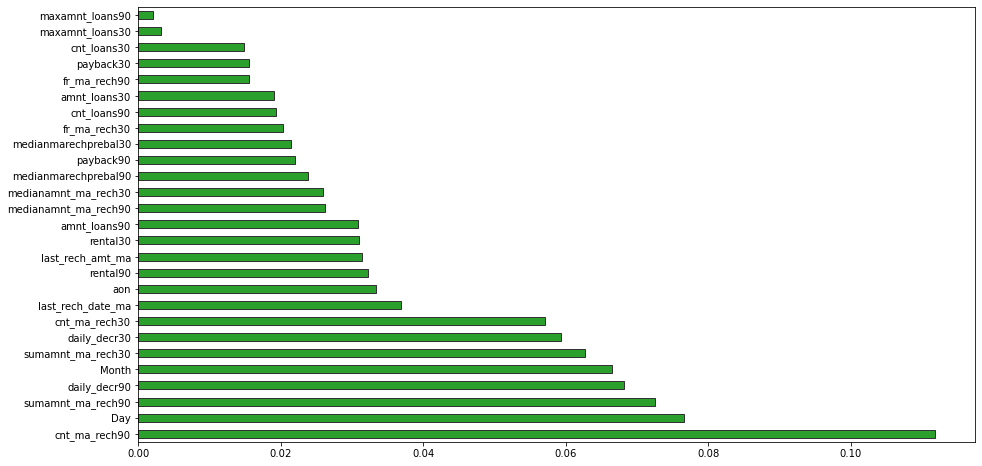

In [91]:
plt.figure(figsize=(15,8))
importances=pd.Series(RFC.feature_importances_,index=x.columns)
importances.nlargest(30).plot(kind='barh',color="tab:green",edgecolor=".2")
plt.show()

Here with the help of RandomForestClassifier we are able to list down the importance or priority given to a column as per it's involvement or weightage in predicting our label. Here we can clearly observe the features which are important for the predictions. The columns cnt_ma_rech90 column contributing more for the predictions.

## Decision Tree Classifier

In [93]:
# Checking Accuracy and evaluation metrics for Decision Tree Classifier
DTC = DecisionTreeClassifier()
DTC.fit(x_train,y_train)
predDTC = DTC.predict(x_test)

# Accuracy Score
DTC_score = accuracy_score(y_test, predDTC)*100
print("The Accuracy Score is:", DTC_score)

# ROC AUC Score
from sklearn.metrics import roc_auc_score
roc_auc_score = roc_auc_score(y_test,predDTC)*100      
print("\nThe roc_auc_score is:", roc_auc_score)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, predDTC)
print("\nThe Confusion Matrix is:\n",conf_matrix)

# Classification Report
class_report = classification_report(y_test,predDTC)
print("\nThe Classification Report is:\n", class_report)

# Cross Validation Score
cv_score = (cross_val_score(DTC, x, y, cv=5).mean())*100
print("The Cross Validation Score is:", cv_score)

# Result of accuracy minus cv scores
Result = DTC_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", Result)

The Accuracy Score is: 91.40058621925336

The roc_auc_score is: 91.40085715122281

The Confusion Matrix is:
 [[50073  4321]
 [ 5038 49401]]

The Classification Report is:
               precision    recall  f1-score   support

           0       0.91      0.92      0.91     54394
           1       0.92      0.91      0.91     54439

    accuracy                           0.91    108833
   macro avg       0.91      0.91      0.91    108833
weighted avg       0.91      0.91      0.91    108833

The Cross Validation Score is: 90.97185920945266

Accuracy Score - Cross Validation Score is 0.42872700980069567


Created the Decision Tree Classifier model and checked for its evaluation metrics and it is giving accuracy 91.40%.

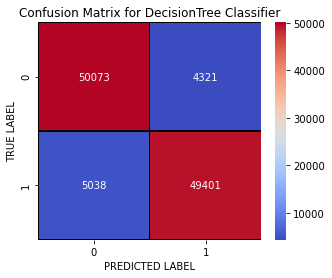

In [94]:
# Lets plot confusion matrix for DecisionTree Classifier
cm = confusion_matrix(y_test,predDTC)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black",fmt = ".0f", ax=ax, cmap="coolwarm",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for DecisionTree Classifier')
plt.show()

With the help of confusion matrix we can able observe the true positive rate, false positive rate, true negative rate and false negative rate. And is plotted predicted value againt True values.

## Random Forest Classifier

In [95]:
# Checking Accuracy and evaluation metrics for Random Forest Classifier
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train) 
predRFC = RFC.predict(x_test)

# Accuracy Score
RFC_score = accuracy_score(y_test, predRFC)*100      
print("The Accuracy Score is:", RFC_score)  

# ROC AUC Score
from sklearn.metrics import roc_auc_score           
roc_auc_score2 = roc_auc_score(y_test,predRFC)*100      
print("\nThe roc_auc_score is:", roc_auc_score2)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, predRFC)     
print("\nThe Confusion Matrix is:\n",conf_matrix)

# Classification Report
class_report = classification_report(y_test,predRFC)
print("\nThe Classification Report is:\n", class_report)

# Cross Validation Score
cv_score2 = (cross_val_score(RFC, x, y, cv=5).mean())*100  
print("The Cross Validation Score is:", cv_score2)

# Result of accuracy minus cv scores
Result = RFC_score - cv_score2
print("\nAccuracy Score - Cross Validation Score is", Result)

The Accuracy Score is: 95.28911267722107

The roc_auc_score is: 95.2892839752852

The Confusion Matrix is:
 [[52057  2337]
 [ 2790 51649]]

The Classification Report is:
               precision    recall  f1-score   support

           0       0.95      0.96      0.95     54394
           1       0.96      0.95      0.95     54439

    accuracy                           0.95    108833
   macro avg       0.95      0.95      0.95    108833
weighted avg       0.95      0.95      0.95    108833

The Cross Validation Score is: 94.92167955576731

Accuracy Score - Cross Validation Score is 0.3674331214537574


Created RandomForestClassifier model and checked for its evaluation metrics. The model giving 95.28% accuracy.

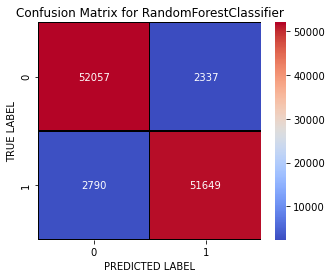

In [96]:
# Lets plot confusion matrix for RandomForestClassifier
cm = confusion_matrix(y_test,predRFC)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black",fmt = ".0f", ax=ax, cmap="coolwarm",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

With the help of confusion matrix we can able to observe the true positive values and predicted values in RandomForest Classifier model.

## ExtraTrees Classifier

In [97]:
# Checking Accuracy and evaluation metrics for ExtraTrees Classifier
XT = ExtraTreesClassifier()
XT.fit(x_train,y_train)                            
predXT = XT.predict(x_test)                       

# Accuracy Score
XT_score = accuracy_score(y_test, predXT)*100  
print("The Accuracy Score is:", XT_score)  

# ROC AUC Score
roc_auc_score3 = roc_auc_score(y_test,predXT)*100      # ROC AUC Score
print("\nThe roc_auc_score is:", roc_auc_score3)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, predXT)     # Confusion Matrix
print("\nThe Confusion Matrix is:\n",conf_matrix)

# Classification Report
class_report = classification_report(y_test,predXT) # Classification Report
print("\nThe Classification Report is:\n", class_report)

# Cross Validation Score
cv_score3 = (cross_val_score(XT, x, y, cv=5).mean())*100  # Cross Validation Score
print("The Cross Validation Score is:", cv_score3)

# Result of accuracy minus cv scores
Result = XT_score - cv_score3
print("\nAccuracy Score - Cross Validation Score is", Result)

The Accuracy Score is: 96.00396938428601

The roc_auc_score is: 96.00456631421025

The Confusion Matrix is:
 [[53006  1388]
 [ 2961 51478]]

The Classification Report is:
               precision    recall  f1-score   support

           0       0.95      0.97      0.96     54394
           1       0.97      0.95      0.96     54439

    accuracy                           0.96    108833
   macro avg       0.96      0.96      0.96    108833
weighted avg       0.96      0.96      0.96    108833

The Cross Validation Score is: 96.3528486893505

Accuracy Score - Cross Validation Score is -0.34887930506448583


Created the ExtraTrees Classifier model and checked for its evaluation metrics. The ExtraTrees Classifier model giving 96% accuracy.

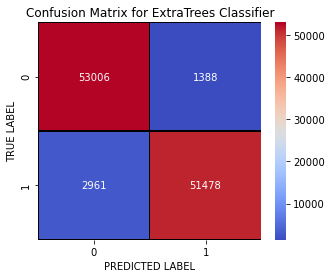

In [98]:
# Lets plot confusion matrix for ExtraTrees Classifier
cm = confusion_matrix(y_test,predXT)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black",fmt = ".0f", ax=ax, cmap="coolwarm",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for ExtraTrees Classifier')
plt.show()

With the help of confusion matrix we can able observe the true positive values and predicted values in Extra Trees Classifier model.

## GradientBoosting Classifier

In [99]:
# Checking Accuracy and evaluation metrics for GradientBoosting Classifier
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)                          
predGB = GB.predict(x_test)                       

# Accuracy Score
GB_score = accuracy_score(y_test, predGB)*100
print("The Accuracy Score is:", GB_score)  

# ROC AUC Score
roc_auc_score4 = roc_auc_score(y_test,predGB)*100
print("\nThe roc_auc_score is:", roc_auc_score4)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, predGB) 
print("\nThe Confusion Matrix is:\n",conf_matrix)

# Classification Report
class_report = classification_report(y_test,predGB) 
print("\nThe Classification Report is:\n", class_report)

# Cross Validation Score
cv_score4 = (cross_val_score(GB, x, y, cv=5).mean())*100 
print("Cross Validation Score:", cv_score4)

# Result of accuracy minus cv scores
Result = GB_score - cv_score4
print("\nAccuracy Score - Cross Validation Score is", Result)

The Accuracy Score is: 90.16842318046916

The roc_auc_score is: 90.16896554410182

The Confusion Matrix is:
 [[49760  4634]
 [ 6066 48373]]

The Classification Report is:
               precision    recall  f1-score   support

           0       0.89      0.91      0.90     54394
           1       0.91      0.89      0.90     54439

    accuracy                           0.90    108833
   macro avg       0.90      0.90      0.90    108833
weighted avg       0.90      0.90      0.90    108833

Cross Validation Score: 89.84223320318081

Accuracy Score - Cross Validation Score is 0.326189977288351


Created GradientBoosting Classifier and checked for its evaluation metrics. The model giving 90.16% accuracy.

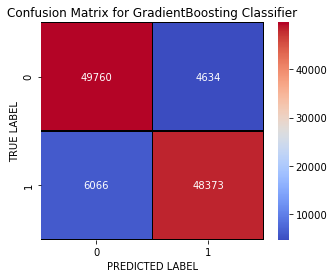

In [100]:
# Lets plot confusion matrix for GradientBoosting Classifier
cm = confusion_matrix(y_test,predGB)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black",fmt = ".0f", ax=ax, cmap="coolwarm",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for GradientBoosting Classifier')
plt.show()

With the help of confusion matrix we can able observe the true positive values and predicted values in GradientBoosting Classifier model.

## Extreme Gradient Boosting Classifier (XGB Classifier)

In [101]:
# Checking Accuracy and evaluation metrics for XGB Classifier
XGB = xgb(verbosity=0)
XGB.fit(x_train,y_train)                           
predXGB = XGB.predict(x_test)                     

#Accuracy Score
XGB_score = accuracy_score(y_test, predXGB)*100      
print("The Accuracy Score is:", XGB_score)  

#ROC AUC Score
roc_auc_score5 = roc_auc_score(y_test,predXGB)*100      
print("\nThe roc_auc_score is:", roc_auc_score5)

# Confusion matrix
conf_matrix = confusion_matrix(y_test, predXGB)     
print("\nThe Confusion Matrix is:\n",conf_matrix)

#Classification Report
class_report = classification_report(y_test,predXGB) 
print("\nThe Classification Report is:\n", class_report)

#Cross Validation Score
cv_score5 = (cross_val_score(XGB, x, y, cv=5).mean())*100  
print("The Cross Validation Score is:", cv_score5)

# Result of accuracy minus cv scores
Result = XGB_score - cv_score5
print("\nAccuracy Score - Cross Validation Score is", Result)

The Accuracy Score is: 95.05572758262659

The roc_auc_score is: 95.05530084777062

The Confusion Matrix is:
 [[51143  3251]
 [ 2130 52309]]

The Classification Report is:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     54394
           1       0.94      0.96      0.95     54439

    accuracy                           0.95    108833
   macro avg       0.95      0.95      0.95    108833
weighted avg       0.95      0.95      0.95    108833

The Cross Validation Score is: 93.59085267125839

Accuracy Score - Cross Validation Score is 1.4648749113681987


Created XGB Classifier and checked for its evaluation metrics. The model giving 95.05% accuracy.

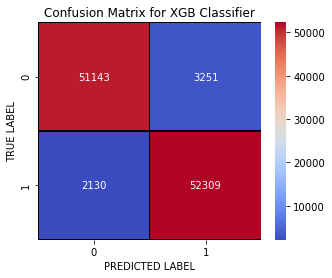

In [102]:
# Lets plot confusion matrix for XGB Classifier
cm = confusion_matrix(y_test,predXGB)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black",fmt = ".0f", ax=ax, cmap="coolwarm",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for XGB Classifier')
plt.show()

With the help of confusion matrix we can able observe the true positive values and predicted values in XGB Classifier model.

## Bagging Classifier

In [104]:
# Checking Accuracy and evaluation metrics for Bagging Classifier
BC = BaggingClassifier()
BC.fit(x_train,y_train)                           
predBC = BC.predict(x_test)                       

#Accuracy Score
BC_score = accuracy_score(y_test, predBC)*100      
print("The Accuracy Score is:", BC_score)  

#ROC AUC Score
roc_auc_score6 = roc_auc_score(y_test,predBC)*100      
print("\nThe roc_auc_score is:", roc_auc_score6)

#Confusion Matrix
conf_matrix = confusion_matrix(y_test, predBC)     
print("\nThe Confusion Matrix is:\n",conf_matrix)

#Classification Report
class_report = classification_report(y_test,predBC) 
print("\nThe Classification Report is:\n", class_report)

#Cross Validation Score
cv_score6 = (cross_val_score(BC, x, y, cv=5).mean())*100  
print("The Cross Validation Score is:", cv_score6)

# Result of accuracy minus cv scores
Result = BC_score - cv_score6
print("\nAccuracy Score - Cross Validation Score is", Result)

The Accuracy Score is: 94.19477548170133

The roc_auc_score is: 94.19532233288732

The Confusion Matrix is:
 [[51956  2438]
 [ 3880 50559]]

The Classification Report is:
               precision    recall  f1-score   support

           0       0.93      0.96      0.94     54394
           1       0.95      0.93      0.94     54439

    accuracy                           0.94    108833
   macro avg       0.94      0.94      0.94    108833
weighted avg       0.94      0.94      0.94    108833

The Cross Validation Score is: 93.70798146180323

Accuracy Score - Cross Validation Score is 0.4867940198980989


Created Bagging Classifier and checked for its evaluation metrics. The model giving 94.19% accuracy.

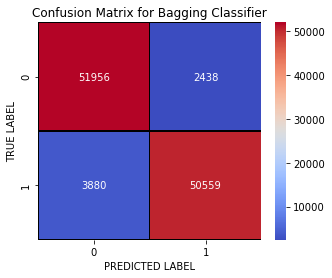

In [105]:
# Lets plot confusion matrix for Bagging Classifier
cm = confusion_matrix(y_test,predBC)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(5,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black",fmt = ".0f", ax=ax, cmap="coolwarm",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Bagging Classifier')
plt.show()

With the help of confusion matrix we can able observe the true positive values and predicted values in Bagging Classifier model.

## Plotting ROC and compare AUC for all the models used

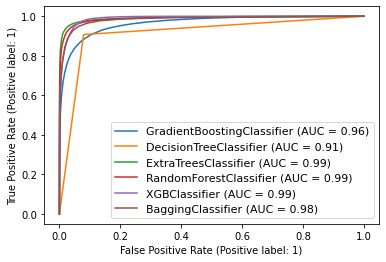

In [106]:
# Plotting for all the models used here
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 

disp = plot_roc_curve(GB,x_test,y_test)     # ax_=Axes with confusion matrix
plot_roc_curve(DTC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(XT, x_test, y_test, ax=disp.ax_)
plot_roc_curve(RFC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(XGB, x_test, y_test, ax=disp.ax_)
plot_roc_curve(BC, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

I have generated the ROC Curve for all the models used here and it shows the AUC score for the models.

## Model Selection

|Model||Accuracy_Score||Cross_Validation_Score||Difference|
|-------||-------||-------||-------|
|DecisionTreeClassifier||91.40||90.971||0.429|
|RandomForestClassifier||95.289||94.921||0.368|
|ExtraTreesClassifier||96.00||96.352||-0.352|
|GradientBoostingClassifier||90.168||89.842||0.326|
|XGBClassifier||95.055||93.590||1.465|
|BaggingClassifier||94.194||93.707||0.487|

From the difference between accuracy and cross validation score, GradientBoostingClassifier has least difference compared to other models. So we can conclude that GradientBoostingClassifier as our best fitting model.

## Hyper Parameter Tuning

In [107]:
from sklearn.model_selection import RandomizedSearchCV

# GradientBoosting Classifier
parameters = {'max_depth': [3,6,9],  
              'max_features':['auto', 'sqrt', 'log2'],
              'learning_rate':[0.1,0.25,0.5],
              'min_samples_leaf': [1,50,100]}

I Have used 4 GradientBoostingClassifier parameters to be saved under the variable "parameters" that will be used in RandomizedSearchCV for finding the best output.

In [108]:
RCV=RandomizedSearchCV(GradientBoostingClassifier(),parameters,cv=5,n_iter =10)

Assigning a variable to the RandomizedSearchCV function after entering all the necessary inputs.

In [109]:
RCV.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(),
                   param_distributions={'learning_rate': [0.1, 0.25, 0.5],
                                        'max_depth': [3, 6, 9],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 50, 100]})

Now we use our training data set to make the RandomizedSearchCV aware of all the hyper parameters that needs to be applied on our best model.

In [110]:
RCV.best_params_

{'min_samples_leaf': 50,
 'max_features': 'auto',
 'max_depth': 9,
 'learning_rate': 0.5}

This gives us the list of parameters which will be used further in our final model creation.

In [112]:
# Creating final model 
MicroCredit_model = GradientBoostingClassifier(min_samples_leaf = 50, max_features = "auto", max_depth = 9,learning_rate = 0.5)
MicroCredit_model.fit(x_train, y_train)
pred = MicroCredit_model.predict(x_test)
acc_score = accuracy_score(y_test,pred)
print("Accuracy score for the Best Model is:", acc_score*100)

Accuracy score for the Best Model is: 95.0061102790514


I have successfully incorporated the hyper parameter tuning using best parameters of GradientBoostingClassifier and the accuracy of the model has been increased by 5% after hyperparameter tuning and received the accuracy score as 95% which is very good.

## Confusion Matrix

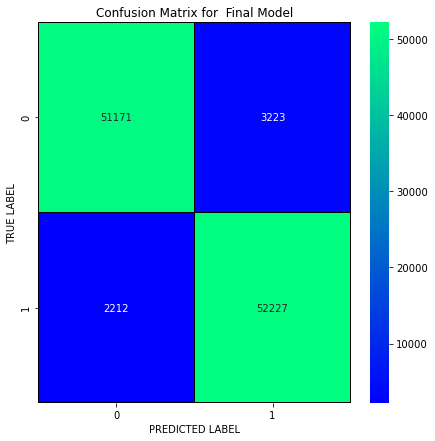

In [113]:
# Lets plot confusion matrix for  FinalModel
cm = confusion_matrix(y_test,pred)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="winter",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  Final Model')
plt.show()

With the help of confusion matrix we can able to see actual and predicted values for the final model. And also we can understand the number of times we got the correct outputs and the number of times my model missed to provide the correct prediction

## Plotting ROC and Compare AUC for the Final model

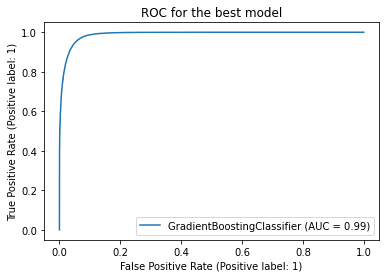

In [114]:
# Let's check the Auc for the best model after hyper parameter tuning
plot_roc_curve(MicroCredit_model, x_test, y_test)
plt.title("ROC for the best model")
plt.show()

I have generated the ROC Curve for my final model and it shows the AUC score for my final model to be of 99% which is increased after tuning the model.

## Saving The Model

In [115]:
# Saving the model using .pkl
import joblib
joblib.dump(MicroCredit_model,"Micro_Credit_Loan_Defaulter(IP3).pkl")

['Micro_Credit_Loan_Defaulter(IP3).pkl']

I am using the joblib option to save the final classification model in the form of .pkl.

## Loading and Predicting the saved model

In [116]:
# Loading the saved model
model=joblib.load("Micro_Credit_Loan_Defaulter(IP3).pkl")

#Prediction
prediction = model.predict(x_test)
prediction

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [117]:
# Creating dataframe for predicted results
pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

Using classification model, we have got the predicted values for micro credit loans for defaulters and non-defaulters. From the predictions we can notice both actual values and predicted values are almost same.

## Conclusion

- This case study aims to give an idea of applying EDA in a real business scenario. In this case study, apart from applying the techniques that we have learnt in the EDA module, we will also develop a basic understanding of risk analytics in banking and financial services and understand how data is used to minimize the risk of losing money while lending to customers.
- From this dataset we were able to understand that the selection of customers for the credit to know whether they are defaulters or non-defaulters are done on the basis of different features.
- First, we loaded the dataset and have done data cleaning and EDA process and pre-processing techniques like checking outliers, skewness, correlation, scaling data etc and got better insights from data visualization.
- Then we did the model training, building the model and finding out the best model on the basis of different metrices like Accuracy Score, Cross Validation Score, roc_auc_score, precision, recall, f1score etc. We tried ensemble techniques like Random Forest Classifier, Extra Trees Classifier, GradientBoosting Classifier, Bagging Classifier etc and some other models like Decision Tree Classifier & XGB Classifier.
- We got GradientBoosting Classifier as the best model among all the models as it gave least difference of accuracy and cross validation score. On this basis we performed the Hyperparameter tuning to finding out the best parameter and improving the scores. The accuracy score increased after tuning. So we concluded that GradientBoosting Classifier as the best algorithm as it was giving high accuracy and AUC after tuning.
- After that we saved the model in a pickle with a filename in order to use whenever we require. Then we loaded the saved file and predicted the values.
- Overall, we can say that this dataset is good for predicting the defaulters level using classification analysis and conclude that GradientBoosting Classifier is the best working algorithm model we obtained. We can improve the data by adding some more features.